In [1]:
import os
import gc
import glob
import math
import random
import pickle
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, auc

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import utils
from torch.autograd import Variable
from torch import autograd

import albumentations as A
from albumentations.pytorch import ToTensorV2

import sys
sys.path.append('../input/timm-pytorch-image-models/pytorch-image-models-master')
# sys.path.append('../input/rangerdeeplearningoptimizer/ranger')
import timm
import wandb
# from ranger import Ranger

np.random.seed(7)
torch.manual_seed(7)

device='cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [2]:
# class Mish_layer(nn.Module):
#     '''
#     The class defines the Mish activation function.
#     '''
#     def __init__(self):
#         super(Mish_layer,self).__init__()
#     def forward(self,x):
#         return x*torch.tanh(F.softplus(x))

In [3]:
def set_seed(seed):
    #Sets the seed for Reprocudibility
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        
set_seed(7)

In [4]:
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb") 

wandb.login(key = wandb_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
config = dict(
    batch_size = 256,
    epochs = 300,
    learning_rate = 3e-4
    )

In [6]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)

    data = []
    for img_path in tqdm(root_list):
        data.append(img_path)
        
    return data

In [7]:
data_root_dir = r'../input/gsocml4scimodel2/Model_II/no_sub/*'
dataset_img_paths_list = img_paths_list(data_root_dir)

test_data_root_dir = r'../input/gsocml4scimodel2test/Model_II_test/no_sub/*'
test_paths_list = img_paths_list(test_data_root_dir)

# #this file was not being read by numpy
# dataset_img_paths_list.remove('../input/gsocml4scimodel8or9/reg_axion/sim_10205913971171895758427970222342137331.npy')

  0%|          | 0/29449 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

In [8]:
val_split = int(0.07 * len(dataset_img_paths_list))

random.shuffle(dataset_img_paths_list)

val_paths_list = dataset_img_paths_list[:val_split]
train_paths_list = dataset_img_paths_list[val_split:]

assert len(dataset_img_paths_list) == (len(train_paths_list) + len(val_paths_list))

len(train_paths_list), len(val_paths_list), len(test_paths_list)

(27388, 2061, 5000)

In [9]:
train_transforms = A.Compose(
            [
#                 A.CenterCrop(height = 50, width = 50, p = 1.0),
                A.HorizontalFlip(p = 0.5),
                A.VerticalFlip(p = 0.5),
                A.Rotate(limit = 360, p = 0.4),
                ToTensorV2()
            ]
        )


test_transforms = A.Compose(
            [
#                 A.CenterCrop(height = 50, width = 50, p = 1.0),
                ToTensorV2()
            ]
        )

In [10]:
def pickelize_file(dicto, pickle_path):
    file_to_write = open(pickle_path, "wb")
    pickle.dump(dicto, file_to_write)
    
    print("Pickleized successfully!")
    
pickelize_file(train_paths_list, "train_paths_list.pickle")
pickelize_file(val_paths_list, "val_paths_list.pickle")

Pickleized successfully!
Pickleized successfully!


In [11]:
class CustomDataset(Dataset):
    def __init__(self, paths_list, transform = None):

        self.transform = transform
        self.data = paths_list
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        path = self.data[idx]
        img = np.load(path, allow_pickle = True)
        img = (img - np.min(img))/(np.max(img) - np.min(img))

       
        if self.transform:
            aug = self.transform(image = img)
            img = aug['image']
        
        img = img.to(torch.float)        

        return img

In [12]:
train_dataset = CustomDataset(train_paths_list, transform = train_transforms)
print(len(train_dataset))

val_dataset = CustomDataset(val_paths_list, transform = test_transforms)
print(len(val_dataset))

test_dataset = CustomDataset(test_paths_list, transform = test_transforms)
print(len(test_dataset))

27388
2061
5000


In [13]:
train_loader = DataLoader(train_dataset, batch_size = config['batch_size'], shuffle = True, num_workers = 2)
val_loader = DataLoader(val_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)
test_loader = DataLoader(test_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)

In [14]:
single_batch = next(iter(train_loader))
single_batch.shape

torch.Size([256, 1, 64, 64])

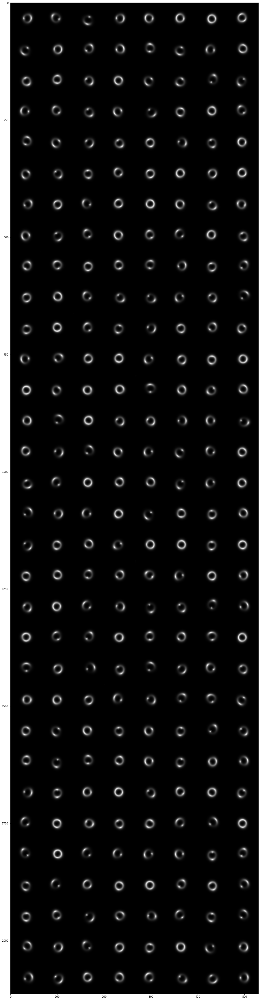

In [15]:
single_batch_grid = utils.make_grid(single_batch, nrow=8)
plt.figure(figsize = (20,70))
plt.imshow(single_batch_grid.permute(1, 2, 0))

In [16]:
class Encoder(nn.Module):

    def __init__(self, in_channels=1, latent_dim = 2048):
        super().__init__()
        
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(in_channels = in_channels, out_channels = 16, kernel_size = 7, stride = 2, padding = 1),
            nn.BatchNorm2d(16),
            nn.PReLU(),

            nn.Conv2d(16, 32, 7, stride=2, padding = 1),
            nn.BatchNorm2d(32),
            nn.PReLU(),
            
            nn.Conv2d(32, 64, 7),
            nn.BatchNorm2d(64),
            nn.PReLU())

        self.flat = nn.Flatten()
        self.enc_lin = nn.Linear(3136, latent_dim)

    def forward(self, x):
        
        x = self.encoder_cnn(x)
        x = self.flat(x)
        x = self.enc_lin(x)

        return x

In [17]:
class Decoder(nn.Module):

    def __init__(self, out_channels = 1, latent_dim = 2048):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dim, 3136),
            nn.PReLU()
        )
     
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 7),
            nn.BatchNorm2d(32),
            nn.PReLU(),
            
            nn.ConvTranspose2d(32, 16, 7, stride = 2, padding = 1, output_padding = 1),
            nn.BatchNorm2d(16),
            nn.PReLU(),

            nn.ConvTranspose2d(16, out_channels, 7, stride = 2, padding = 1, output_padding = 1),
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = x.view(x.shape[0], 64, 7, 7)
        x = self.decoder_conv(x)
#         x = torch.tanh(x)
        return x

In [18]:
class Discriminator(nn.Module):

    def __init__(self, dim_z = 2048 , dim_h = 256):
        super(Discriminator,self).__init__()
        self.dim_z = dim_z
        self.dim_h = dim_h
        self.network = []
        self.network.extend([
            nn.Linear(self.dim_z, self.dim_h),
            nn.PReLU(),
            nn.Linear(self.dim_h, self.dim_h),
            nn.PReLU(),
            nn.Linear(self.dim_h,1),
            nn.Sigmoid(),
        ])
        self.network = nn.Sequential(*self.network)

    def forward(self, z):
        disc = self.network(z)
        return disc

In [19]:
x = torch.randn(config["batch_size"], 1, 64, 64)
encoder = Encoder()
decoder = Decoder()
disc = Discriminator()

encoded = encoder(x)
print(encoded.shape)
print(decoder(encoded).shape)
print(disc(encoded).shape)



del encoder, decoder, disc, x 
gc.collect()

torch.Size([256, 2048])
torch.Size([256, 1, 64, 64])
torch.Size([256, 1])


146

In [20]:
def train_epoch(model, dataloader, ae_criterion, optimizers, example_ct):
    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
    optim_encoder, optim_decoder, optim_disc, optim_encoder_reg = optimizers["optim_encoder"], optimizers["optim_decoder"], optimizers["optim_disc"], optimizers["optim_encoder_reg"]
    encoder.train()
    decoder.train()
    disc.train()
    
    rec_losses = []
    disc_losses = []
    gen_losses = []
    
    EPS = 1e-12
    
    loop = tqdm(enumerate(dataloader),total = len(dataloader))
    for batch_idx, img_batch in loop:

        X = img_batch.to(device)
        example_ct += len(img_batch)
        
        #update autoencoder weights via reconstruction loss
        encoding = encoder(X)
        fake = decoder(encoding)
        ae_loss = ae_criterion(fake, X)
        rec_losses.append(ae_loss.item())
        
        optim_encoder.zero_grad()
        optim_decoder.zero_grad()
        ae_loss.backward()
        optim_encoder.step()
        optim_decoder.step()
        
        
        #update discriminator weights via cross-entropy loss
        z_real_gauss = (torch.randn(X.shape[0], 2048) * 5.).to(device)
        disc_real_gauss = disc(z_real_gauss)
        z_fake_gauss = encoder(X)
        disc_fake_gauss = disc(z_fake_gauss)
        
        disc_loss = -torch.mean(torch.log(disc_real_gauss + EPS) + torch.log(1- disc_fake_gauss + EPS))
        disc_losses.append(disc_loss.detach().cpu().numpy())
        
        optim_disc.zero_grad()
        disc_loss.backward()
        optim_disc.step()
        
        
        #update generator/encoder via regularization loss
        z_fake_gauss = encoder(X)
        disc_fake_gauss = disc(z_fake_gauss)
        
        gen_loss = -torch.mean(torch.log(disc_fake_gauss + EPS))
        gen_losses.append(gen_loss.detach().cpu().numpy())
        
        optim_encoder_reg.zero_grad()
        gen_loss.backward()
        optim_encoder_reg.step()



    return model, np.mean(rec_losses), np.mean(disc_losses), np.mean(gen_losses), example_ct

In [21]:
def test_epoch(model, dataloader, criterion):
    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
   
    encoder.eval()
    decoder.eval()
    disc.eval()
    
    test_rec_losses = []

    y_pred_list = []
    y_truth_list = []

    with torch.no_grad():

        loop = tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, img_batch in loop:
            X = img_batch.to(device)
            y_truth_list.append(X.detach().cpu().numpy())

            #forward prop
            encoded_space = encoder(X)
            recon = decoder(encoded_space)
            
            y_pred_list.append(recon.detach().cpu().numpy())

            #loss
            loss = criterion(recon, X).item() 

            #batch loss and accuracy
            test_rec_losses.append(loss)


    return y_pred_list, y_truth_list, np.mean(test_rec_losses)

In [22]:
def plot_ae_outputs(model,dataset,epoch, n = 10):
    
    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
   
    encoder.eval()
    decoder.eval()
    disc.eval()
    
    plt.figure(figsize=(16,4.5))
    random_index = random.randint(0,len(dataset) - (n + 1)) 
    
    
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        img = dataset[random_index + i].unsqueeze(0).to(device)


        with torch.no_grad():
            encoded_space = encoder(img)
            rec_img = decoder(encoded_space)
            
        img = img.permute(0,2,3,1)
        plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
            
        ax = plt.subplot(2, n, i + 1 + n)
        rec_img = rec_img.permute(0,2,3,1)
        plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
            
    plot_name = f"Reconstructions"
    plt.savefig(plot_name, format="png", dpi=80)  
    pic = Image.open(plot_name)
    
    wandb.log({plot_name: [wandb.Image(pic, caption = f"Epoch : {epoch+1}")]})
            
    plt.show()   

In [23]:
def fit_model(model, config, checkpoint_path):
        
        encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
        # access all HPs through wandb.config, so logging matches execution!
        config = wandb.config

        EPOCHS = config.epochs
        LR = config.learning_rate
        
        #optimizers
        optim_encoder = optim.Adam(encoder.parameters(), lr = LR)
        optim_decoder = optim.Adam(decoder.parameters(), lr = LR)
        optim_disc = optim.Adam(disc.parameters(), lr = LR)
        optim_encoder_reg = optim.Adam(encoder.parameters(), lr = LR * 0.1)
        optimizers = {
            'optim_encoder' : optim_encoder,
            'optim_decoder' : optim_decoder,
            'optim_disc' : optim_disc,
            'optim_encoder_reg' : optim_encoder_reg
        }
        
        ae_criterion = nn.MSELoss()

        loss_dict = {'train_rec_loss' : [],'val_rec_loss' : [], 'disc_loss' : [], 'gen_loss' : []}
        example_ct = 0  # number of examples seen
        min_val_loss = 999 #high value to initlialize

        wandb.watch((model["enc"], model["dec"], model["disc"]), ae_criterion, log="all", log_freq = 10)
        
        for epoch in range(EPOCHS):
            print(f"Epoch {epoch+1}/{EPOCHS}:")
            model, train_rec_loss, disc_loss, gen_loss, example_ct = train_epoch(model, train_loader, ae_criterion, optimizers, example_ct)
            _, _, val_rec_loss  = test_epoch(model, val_loader, ae_criterion)
#             scheduler.step()

            print(f'Train Recon loss: {train_rec_loss}, Val Recon loss: {val_rec_loss}, \n Disc loss: {disc_loss}, Gen loss: {gen_loss}\n')
            
            if val_rec_loss < min_val_loss:
                min_val_loss = val_rec_loss
                print("New lower val loss. Saving model checkpoint!")
                torch.save(encoder.state_dict(), checkpoint_path + 'encoder.pth')
                torch.save(decoder.state_dict(), checkpoint_path + 'decoder.pth')
                torch.save(disc.state_dict(), checkpoint_path + 'discriminator.pth')
    
            wandb.log({"epoch": epoch + 1, 
                       "train_rec_loss":train_rec_loss, "val_rec_loss": val_rec_loss,
                      "disc_loss" : disc_loss, "gen_loss": gen_loss
                      }, step = example_ct)

            loss_dict['train_rec_loss'].append(train_rec_loss)
            loss_dict['val_rec_loss'].append(val_rec_loss)
            
            loss_dict['disc_loss'].append(disc_loss)
            loss_dict['gen_loss'].append(gen_loss)

            if epoch % 5 == 0 or epoch + 1 == EPOCHS:
                plot_ae_outputs(model, val_dataset, epoch,10)


        return model, loss_dict

In [24]:
wandb.init(project="gsoc_model2-AD", config = config)

wandb: Currently logged in as: saranga7. Use `wandb login --relogin` to force relogin


In [25]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)
disc = Discriminator().to(device)

model = {'enc':encoder,
        'dec': decoder,
        'disc': disc}

In [26]:
PATH = "conv_AAE/"

if not os.path.isdir(PATH):
    os.mkdir(PATH)

Epoch 1/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.027087238671641065, Val Recon loss: 0.0029099348466843367, 
 Disc loss: 0.2044006884098053, Gen loss: 4.908797740936279

New lower val loss. Saving model checkpoint!


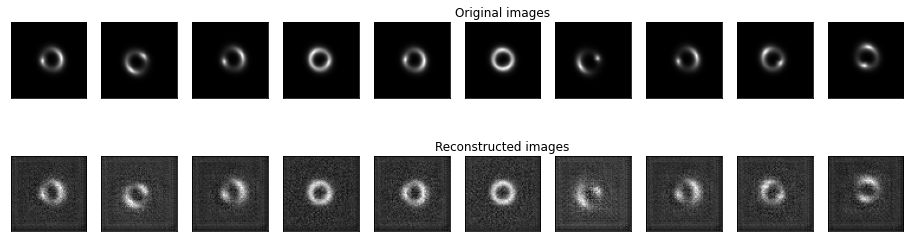

Epoch 2/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0020747876118990443, Val Recon loss: 0.002126681333821681, 
 Disc loss: 0.16071739792823792, Gen loss: 8.356884002685547

New lower val loss. Saving model checkpoint!
Epoch 3/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0013386636567693725, Val Recon loss: 0.0010920785910760362, 
 Disc loss: 0.12321259081363678, Gen loss: 8.527052879333496

New lower val loss. Saving model checkpoint!
Epoch 4/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0009632910912960907, Val Recon loss: 0.0008063266286626458, 
 Disc loss: 0.10218240320682526, Gen loss: 9.90361499786377

New lower val loss. Saving model checkpoint!
Epoch 5/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0007847343586716001, Val Recon loss: 0.0006816602997585303, 
 Disc loss: 0.07518059760332108, Gen loss: 8.685208320617676

New lower val loss. Saving model checkpoint!
Epoch 6/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0006479154679288862, Val Recon loss: 0.000539061399952819, 
 Disc loss: 0.03778634965419769, Gen loss: 7.472855091094971

New lower val loss. Saving model checkpoint!


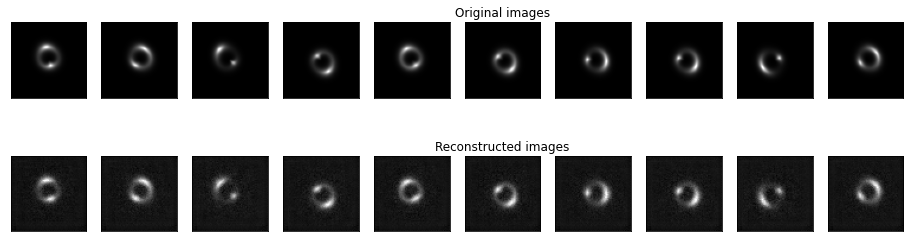

Epoch 7/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0005588089836713484, Val Recon loss: 0.0003826782146158318, 
 Disc loss: 0.033981241285800934, Gen loss: 10.412346839904785

New lower val loss. Saving model checkpoint!
Epoch 8/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0005060325074227196, Val Recon loss: 0.0005452668087349997, 
 Disc loss: 0.03472060337662697, Gen loss: 10.717580795288086

Epoch 9/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00043882031584480585, Val Recon loss: 0.0003651054414351367, 
 Disc loss: 0.03188213333487511, Gen loss: 10.462937355041504

New lower val loss. Saving model checkpoint!
Epoch 10/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0004808495471811044, Val Recon loss: 0.000616007853144159, 
 Disc loss: 0.020625539124011993, Gen loss: 9.657957077026367

Epoch 11/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0004347022840422448, Val Recon loss: 0.0006851378000444836, 
 Disc loss: 0.018534652888774872, Gen loss: 9.780426979064941



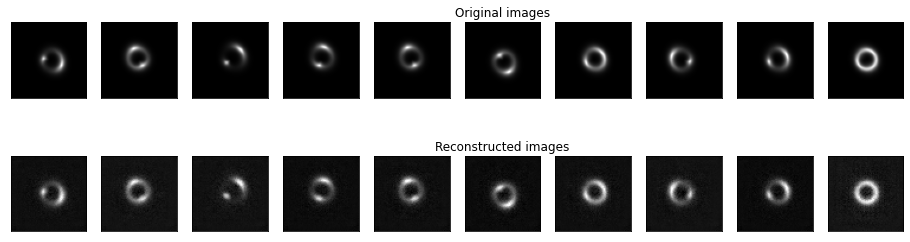

Epoch 12/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.000420915484036728, Val Recon loss: 0.00041000573805326387, 
 Disc loss: 0.015094557777047157, Gen loss: 9.915080070495605

Epoch 13/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0003651219496838574, Val Recon loss: 0.00027924939705472853, 
 Disc loss: 0.014974015764892101, Gen loss: 9.679582595825195

New lower val loss. Saving model checkpoint!
Epoch 14/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0003556925746303261, Val Recon loss: 0.0003514467421660407, 
 Disc loss: 0.018294962123036385, Gen loss: 10.251599311828613

Epoch 15/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0003386002500970178, Val Recon loss: 0.00022953045198745612, 
 Disc loss: 0.014043721370398998, Gen loss: 13.968973159790039

New lower val loss. Saving model checkpoint!
Epoch 16/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00034115536717227966, Val Recon loss: 0.0002532479734832628, 
 Disc loss: 0.018579144030809402, Gen loss: 13.64006233215332



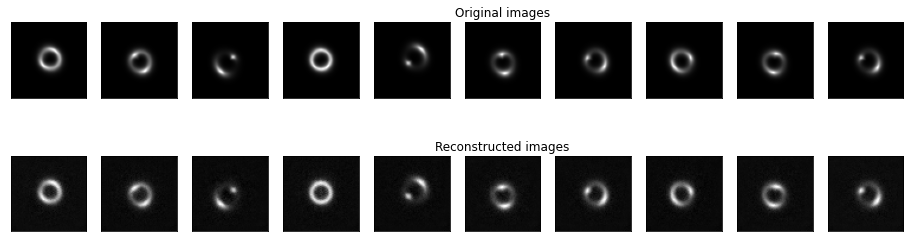

Epoch 17/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00032486074966395917, Val Recon loss: 0.00027855357944241003, 
 Disc loss: 0.016837747767567635, Gen loss: 12.305686950683594

Epoch 18/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002666923796016044, Val Recon loss: 0.00021668664703611284, 
 Disc loss: 0.016706181690096855, Gen loss: 12.802675247192383

New lower val loss. Saving model checkpoint!
Epoch 19/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002585712324710406, Val Recon loss: 0.00019464751433891556, 
 Disc loss: 0.017834648489952087, Gen loss: 12.576934814453125

New lower val loss. Saving model checkpoint!
Epoch 20/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00026480893908551606, Val Recon loss: 0.00017962626750684448, 
 Disc loss: 0.014046517200767994, Gen loss: 13.188197135925293

New lower val loss. Saving model checkpoint!
Epoch 21/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002523858673276519, Val Recon loss: 0.00016177410887192108, 
 Disc loss: 0.012606091797351837, Gen loss: 11.141132354736328

New lower val loss. Saving model checkpoint!


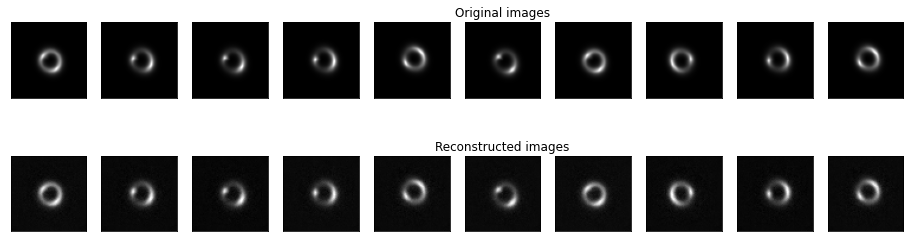

Epoch 22/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00022034542284205243, Val Recon loss: 0.0002113114977772865, 
 Disc loss: 0.011951160617172718, Gen loss: 13.514300346374512

Epoch 23/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002520479979678971, Val Recon loss: 0.00021222167803595463, 
 Disc loss: 0.012283779680728912, Gen loss: 12.647871971130371

Epoch 24/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0002291587987320637, Val Recon loss: 0.00014952515226064457, 
 Disc loss: 0.012474644929170609, Gen loss: 13.600776672363281

New lower val loss. Saving model checkpoint!
Epoch 25/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00020767298076088567, Val Recon loss: 0.00022818723098478385, 
 Disc loss: 0.01092748437076807, Gen loss: 15.939167976379395

Epoch 26/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00020061973259331676, Val Recon loss: 0.00015179021930735972, 
 Disc loss: 0.011475691571831703, Gen loss: 14.481614112854004



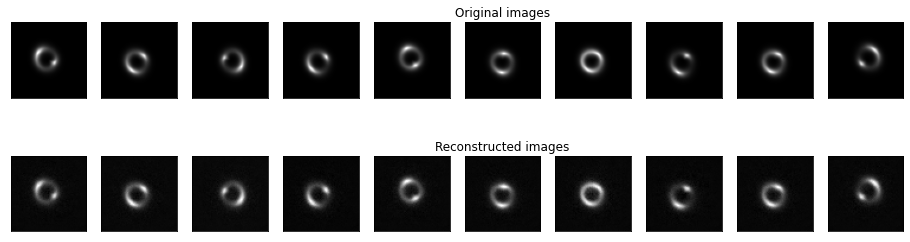

Epoch 27/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0001646932235578397, Val Recon loss: 0.00013905330625776615, 
 Disc loss: 0.012583084404468536, Gen loss: 20.491392135620117

New lower val loss. Saving model checkpoint!
Epoch 28/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.0001702329960421041, Val Recon loss: 0.0001254622224627787, 
 Disc loss: 0.015603594481945038, Gen loss: 21.054128646850586

New lower val loss. Saving model checkpoint!
Epoch 29/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00015669240947828027, Val Recon loss: 0.00014139752117140839, 
 Disc loss: 0.010658771730959415, Gen loss: 19.703643798828125

Epoch 30/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00018024276281058545, Val Recon loss: 0.00020250549358833168, 
 Disc loss: 0.013880249112844467, Gen loss: 16.003053665161133

Epoch 31/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00018031152917798957, Val Recon loss: 0.0001201456810425346, 
 Disc loss: 0.012957565486431122, Gen loss: 15.60081958770752

New lower val loss. Saving model checkpoint!


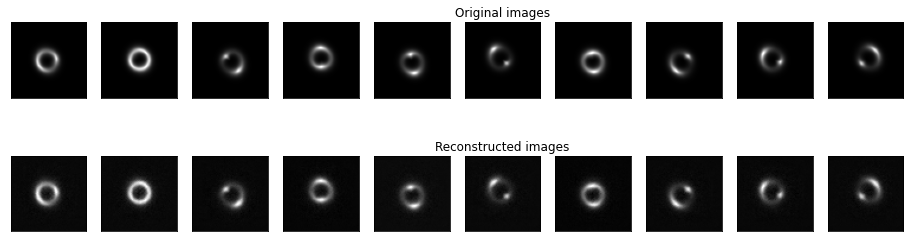

Epoch 32/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00017841918282178188, Val Recon loss: 0.0001596214472859477, 
 Disc loss: 0.011237885802984238, Gen loss: 15.142294883728027

Epoch 33/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.000159431281611084, Val Recon loss: 0.0001130876181479026, 
 Disc loss: 0.011970600113272667, Gen loss: 16.364887237548828

New lower val loss. Saving model checkpoint!
Epoch 34/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00014811864828040267, Val Recon loss: 0.00013411245244141255, 
 Disc loss: 0.013043620623648167, Gen loss: 15.528072357177734

Epoch 35/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00015387633610320947, Val Recon loss: 0.00017029515583999455, 
 Disc loss: 0.0168527290225029, Gen loss: 17.18758201599121

Epoch 36/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00013968922453769266, Val Recon loss: 0.00011699627955547637, 
 Disc loss: 0.013978959992527962, Gen loss: 16.349546432495117



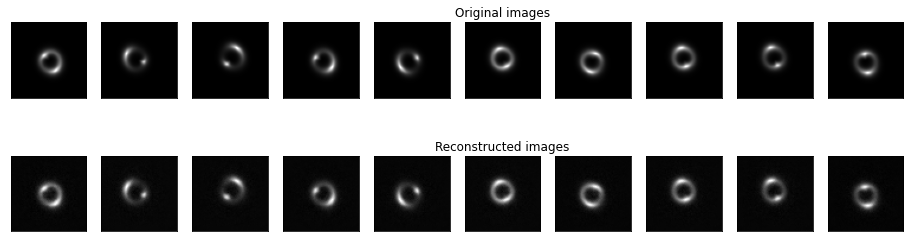

Epoch 37/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00014697859078976455, Val Recon loss: 0.0001102981162451518, 
 Disc loss: 0.01585390605032444, Gen loss: 18.184173583984375

New lower val loss. Saving model checkpoint!
Epoch 38/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00011752754714770816, Val Recon loss: 0.00010714415839174762, 
 Disc loss: 0.012461203150451183, Gen loss: 15.469971656799316

New lower val loss. Saving model checkpoint!
Epoch 39/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00012057606547267968, Val Recon loss: 0.00012572140258271247, 
 Disc loss: 0.014717894606292248, Gen loss: 14.34718132019043

Epoch 40/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00012299949254309671, Val Recon loss: 8.836674371397951e-05, 
 Disc loss: 0.010819170624017715, Gen loss: 16.509262084960938

New lower val loss. Saving model checkpoint!
Epoch 41/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00011186554598748232, Val Recon loss: 0.00013091771203714112, 
 Disc loss: 0.012157796882092953, Gen loss: 16.693044662475586



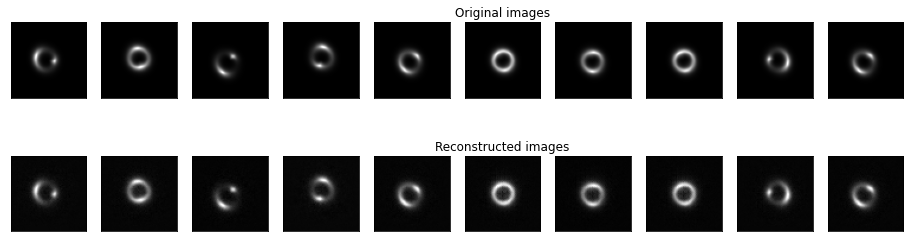

Epoch 42/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.000127085671903213, Val Recon loss: 0.00019621736686935442, 
 Disc loss: 0.012361838482320309, Gen loss: 16.18975257873535

Epoch 43/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00010164158332279108, Val Recon loss: 7.447183209781845e-05, 
 Disc loss: 0.01215765718370676, Gen loss: 17.30059242248535

New lower val loss. Saving model checkpoint!
Epoch 44/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.369777222316295e-05, Val Recon loss: 0.00011657666214483065, 
 Disc loss: 0.011270405724644661, Gen loss: 21.842504501342773

Epoch 45/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.6234074624029e-05, Val Recon loss: 6.739212080396505e-05, 
 Disc loss: 0.01449661049991846, Gen loss: 19.335906982421875

New lower val loss. Saving model checkpoint!
Epoch 46/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 0.00010461100172055624, Val Recon loss: 6.767115701222792e-05, 
 Disc loss: 0.01501088123768568, Gen loss: 16.33679962158203



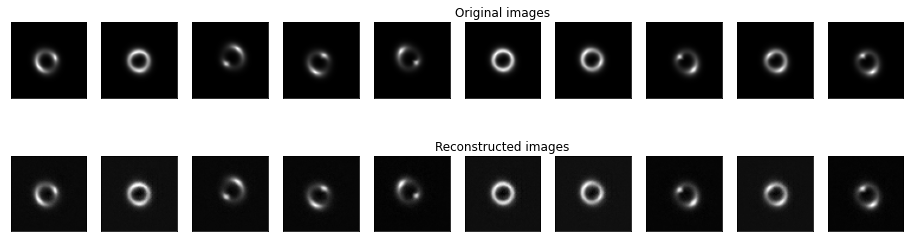

Epoch 47/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.705421063835758e-05, Val Recon loss: 9.18299047043547e-05, 
 Disc loss: 0.015206762589514256, Gen loss: 16.47589111328125

Epoch 48/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.959614770502183e-05, Val Recon loss: 8.04621748910803e-05, 
 Disc loss: 0.01208149641752243, Gen loss: 18.60373878479004

Epoch 49/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.982858191098513e-05, Val Recon loss: 6.580748029389522e-05, 
 Disc loss: 0.010694840922951698, Gen loss: 13.966978073120117

New lower val loss. Saving model checkpoint!
Epoch 50/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.95034650075641e-05, Val Recon loss: 5.782350328647428e-05, 
 Disc loss: 0.015556936152279377, Gen loss: 17.185834884643555

New lower val loss. Saving model checkpoint!
Epoch 51/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.340164768422527e-05, Val Recon loss: 6.49928721638086e-05, 
 Disc loss: 0.012628380209207535, Gen loss: 14.06436824798584



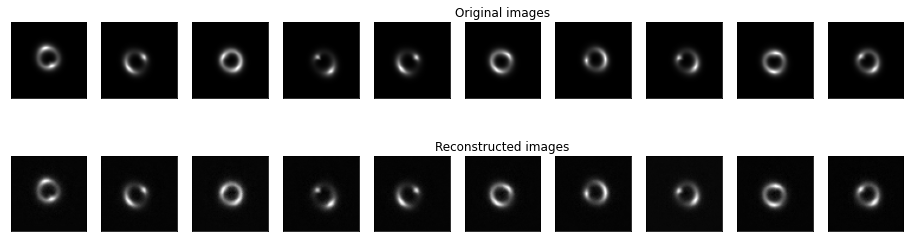

Epoch 52/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.335847828632969e-05, Val Recon loss: 5.196146715510016e-05, 
 Disc loss: 0.01232092920690775, Gen loss: 14.82483959197998

New lower val loss. Saving model checkpoint!
Epoch 53/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.05113220543309e-05, Val Recon loss: 5.927933428514128e-05, 
 Disc loss: 0.013933476060628891, Gen loss: 14.148788452148438

Epoch 54/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 8.207586700413333e-05, Val Recon loss: 5.4177277585646756e-05, 
 Disc loss: 0.012358127161860466, Gen loss: 15.101765632629395

Epoch 55/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.858247461338162e-05, Val Recon loss: 6.69091855848415e-05, 
 Disc loss: 0.0157263595610857, Gen loss: 14.95077133178711

Epoch 56/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.594142159611361e-05, Val Recon loss: 4.674028766910649e-05, 
 Disc loss: 0.012707933783531189, Gen loss: 16.25266456604004

New lower val loss. Saving model checkpoint!


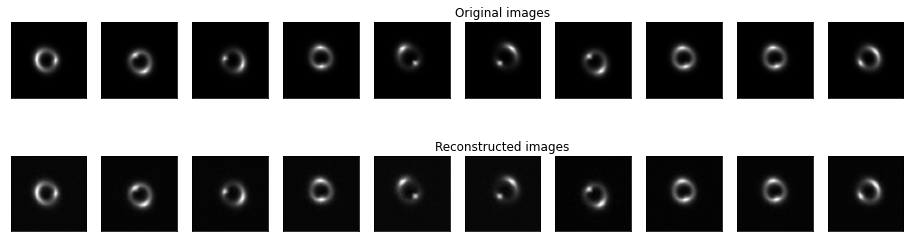

Epoch 57/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.2663768337959e-05, Val Recon loss: 5.6923878421204994e-05, 
 Disc loss: 0.011749448254704475, Gen loss: 16.333003997802734

Epoch 58/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.464533545903722e-05, Val Recon loss: 4.941363860982367e-05, 
 Disc loss: 0.01588238961994648, Gen loss: 15.890454292297363

Epoch 59/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.399210398178983e-05, Val Recon loss: 4.9433337052404466e-05, 
 Disc loss: 0.01762285828590393, Gen loss: 18.27893829345703

Epoch 60/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.011953674128419e-05, Val Recon loss: 5.6496163678174424e-05, 
 Disc loss: 0.01077518705278635, Gen loss: 19.541461944580078

Epoch 61/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.173026934864486e-05, Val Recon loss: 5.574501968415765e-05, 
 Disc loss: 0.01466919481754303, Gen loss: 17.945453643798828



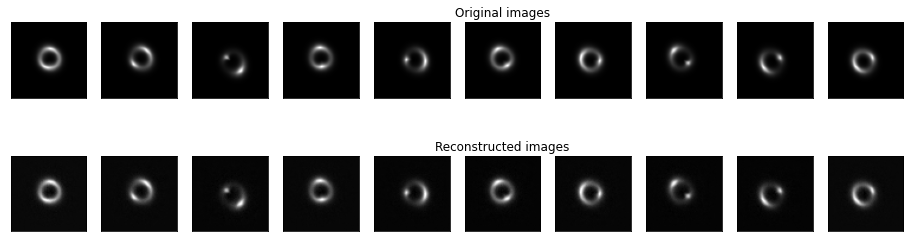

Epoch 62/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.136181594305628e-05, Val Recon loss: 4.7470987839106885e-05, 
 Disc loss: 0.017794182524085045, Gen loss: 16.769594192504883

Epoch 63/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 7.231314024652972e-05, Val Recon loss: 7.78804565521164e-05, 
 Disc loss: 0.015323609113693237, Gen loss: 15.61258316040039

Epoch 64/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.768526898464188e-05, Val Recon loss: 4.195625499253058e-05, 
 Disc loss: 0.016918549314141273, Gen loss: 16.09307098388672

New lower val loss. Saving model checkpoint!
Epoch 65/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 6.38724170776441e-05, Val Recon loss: 6.002792441803548e-05, 
 Disc loss: 0.016927579417824745, Gen loss: 14.303290367126465

Epoch 66/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.905925782852171e-05, Val Recon loss: 3.7130527845066455e-05, 
 Disc loss: 0.01447000727057457, Gen loss: 16.500354766845703

New lower val loss. Saving model checkpoint!


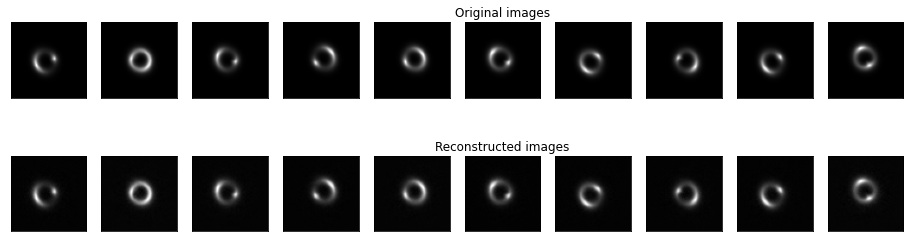

Epoch 67/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.402628414792e-05, Val Recon loss: 6.21768158453051e-05, 
 Disc loss: 0.016341088339686394, Gen loss: 17.713376998901367

Epoch 68/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.800216294858805e-05, Val Recon loss: 3.138310542757002e-05, 
 Disc loss: 0.021166998893022537, Gen loss: 14.197154998779297

New lower val loss. Saving model checkpoint!
Epoch 69/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.079008977224824e-05, Val Recon loss: 3.68713562137499e-05, 
 Disc loss: 0.018836183473467827, Gen loss: 16.739614486694336

Epoch 70/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.852163753903114e-05, Val Recon loss: 3.593850690069505e-05, 
 Disc loss: 0.0182478129863739, Gen loss: 14.702921867370605

Epoch 71/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.998764647285141e-05, Val Recon loss: 4.7373985580634326e-05, 
 Disc loss: 0.021126337349414825, Gen loss: 16.10683822631836



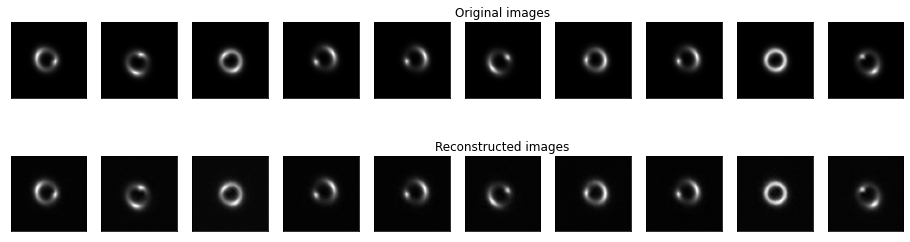

Epoch 72/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.494989391608886e-05, Val Recon loss: 4.0208694069103025e-05, 
 Disc loss: 0.021291546523571014, Gen loss: 18.006113052368164

Epoch 73/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.8627453286605496e-05, Val Recon loss: 5.481558319944371e-05, 
 Disc loss: 0.01723560132086277, Gen loss: 21.46710777282715

Epoch 74/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.0295956642802144e-05, Val Recon loss: 3.509052516569177e-05, 
 Disc loss: 0.018983038142323494, Gen loss: 17.667226791381836

Epoch 75/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 5.0741296826489705e-05, Val Recon loss: 2.6350917727945165e-05, 
 Disc loss: 0.019486749544739723, Gen loss: 15.976922035217285

New lower val loss. Saving model checkpoint!
Epoch 76/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.6578744629280484e-05, Val Recon loss: 3.195153031912115e-05, 
 Disc loss: 0.0225935410708189, Gen loss: 19.463878631591797



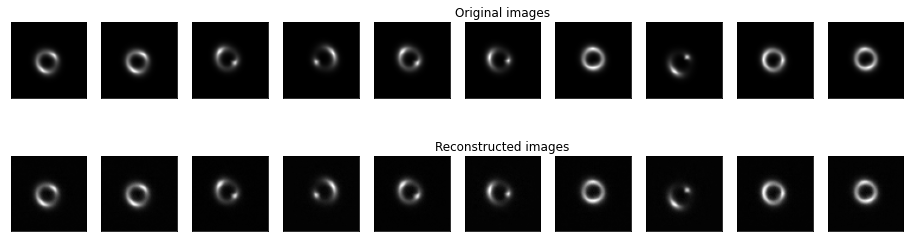

Epoch 77/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.787262670981924e-05, Val Recon loss: 4.9823106463817465e-05, 
 Disc loss: 0.017640123143792152, Gen loss: 17.494312286376953

Epoch 78/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.446252800522059e-05, Val Recon loss: 4.971687222779211e-05, 
 Disc loss: 0.02171642705798149, Gen loss: 17.2825984954834

Epoch 79/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.5395134174358535e-05, Val Recon loss: 3.878916605673213e-05, 
 Disc loss: 0.025248603895306587, Gen loss: 15.929183959960938

Epoch 80/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.548745798452966e-05, Val Recon loss: 3.5780240674891196e-05, 
 Disc loss: 0.026944627985358238, Gen loss: 17.899677276611328

Epoch 81/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.3035229970891435e-05, Val Recon loss: 4.483111277093283e-05, 
 Disc loss: 0.02738341875374317, Gen loss: 18.51445198059082



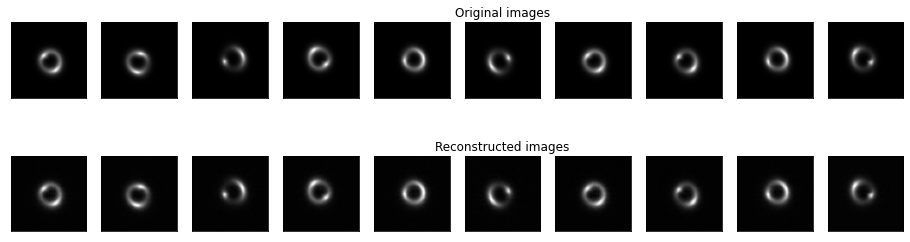

Epoch 82/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.9971050725152025e-05, Val Recon loss: 2.8444519557524472e-05, 
 Disc loss: 0.030569883063435555, Gen loss: 20.02475357055664

Epoch 83/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.2796038814290494e-05, Val Recon loss: 3.199211439803346e-05, 
 Disc loss: 0.0252657663077116, Gen loss: 18.388446807861328

Epoch 84/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.963501366572324e-05, Val Recon loss: 4.707281146289056e-05, 
 Disc loss: 0.02577953413128853, Gen loss: 17.82558250427246

Epoch 85/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.040033848035241e-05, Val Recon loss: 4.022142416538877e-05, 
 Disc loss: 0.025515533983707428, Gen loss: 15.308587074279785

Epoch 86/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.0428330568285554e-05, Val Recon loss: 5.81134388792432e-05, 
 Disc loss: 0.034941963851451874, Gen loss: 17.25669288635254



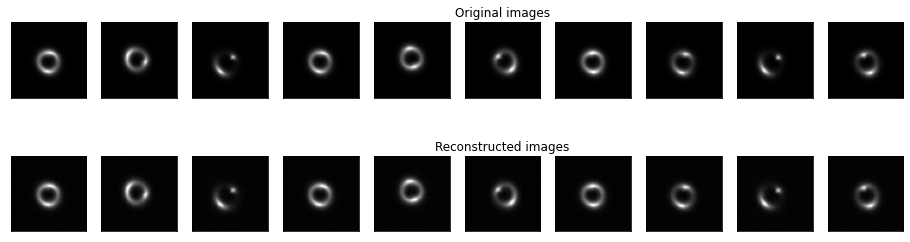

Epoch 87/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.1801848429909073e-05, Val Recon loss: 2.3970719363812048e-05, 
 Disc loss: 0.022435791790485382, Gen loss: 19.020456314086914

New lower val loss. Saving model checkpoint!
Epoch 88/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.814242059276788e-05, Val Recon loss: 3.680501524488338e-05, 
 Disc loss: 0.02482864260673523, Gen loss: 18.888153076171875

Epoch 89/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.775836478007052e-05, Val Recon loss: 3.082074464247045e-05, 
 Disc loss: 0.02588624134659767, Gen loss: 18.1800594329834

Epoch 90/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.0269287212786625e-05, Val Recon loss: 2.823373304434224e-05, 
 Disc loss: 0.02890508808195591, Gen loss: 15.963505744934082

Epoch 91/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.905374495988215e-05, Val Recon loss: 2.6654757473604856e-05, 
 Disc loss: 0.027973417192697525, Gen loss: 15.431841850280762



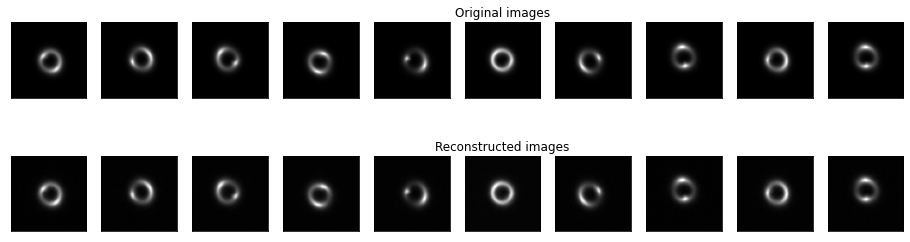

Epoch 92/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.6158467448212064e-05, Val Recon loss: 1.9670880444917e-05, 
 Disc loss: 0.027351481840014458, Gen loss: 18.70937156677246

New lower val loss. Saving model checkpoint!
Epoch 93/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.364336671183652e-05, Val Recon loss: 2.701177901245602e-05, 
 Disc loss: 0.028873058035969734, Gen loss: 18.94399642944336

Epoch 94/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 4.068848916474147e-05, Val Recon loss: 4.505936562458778e-05, 
 Disc loss: 0.034315384924411774, Gen loss: 16.539310455322266

Epoch 95/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.771832907829699e-05, Val Recon loss: 3.344530179876731e-05, 
 Disc loss: 0.03130505234003067, Gen loss: 16.744352340698242

Epoch 96/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.432127373471473e-05, Val Recon loss: 3.0390554456971586e-05, 
 Disc loss: 0.031579677015542984, Gen loss: 16.709503173828125



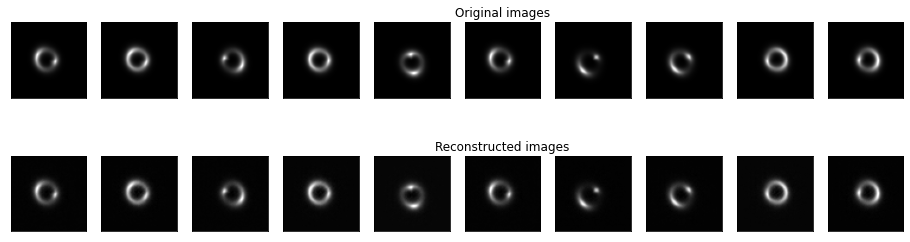

Epoch 97/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.485766812496945e-05, Val Recon loss: 4.198388746266978e-05, 
 Disc loss: 0.031578294932842255, Gen loss: 16.155353546142578

Epoch 98/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.482535819818971e-05, Val Recon loss: 2.488874431744787e-05, 
 Disc loss: 0.034587204456329346, Gen loss: 13.448869705200195

Epoch 99/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.291914220077908e-05, Val Recon loss: 3.86350491478677e-05, 
 Disc loss: 0.036757711321115494, Gen loss: 13.183022499084473

Epoch 100/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.301522848003209e-05, Val Recon loss: 2.884198208145487e-05, 
 Disc loss: 0.03008255362510681, Gen loss: 15.62578296661377

Epoch 101/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.368100886155359e-05, Val Recon loss: 5.3413061525336365e-05, 
 Disc loss: 0.033099591732025146, Gen loss: 14.885643005371094



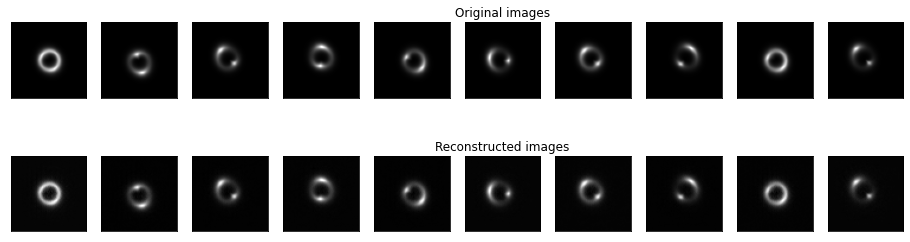

Epoch 102/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.521134110266086e-05, Val Recon loss: 2.61227396549657e-05, 
 Disc loss: 0.034738194197416306, Gen loss: 15.74783992767334

Epoch 103/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.356202864566835e-05, Val Recon loss: 2.4514748777922552e-05, 
 Disc loss: 0.03146911412477493, Gen loss: 16.115097045898438

Epoch 104/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.133875278227802e-05, Val Recon loss: 4.464647807051531e-05, 
 Disc loss: 0.028511056676506996, Gen loss: 17.050853729248047

Epoch 105/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.279539048669003e-05, Val Recon loss: 2.1344009534611057e-05, 
 Disc loss: 0.0319928377866745, Gen loss: 15.762679100036621

Epoch 106/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.0342602513313823e-05, Val Recon loss: 2.736068705012763e-05, 
 Disc loss: 0.041588664054870605, Gen loss: 13.741169929504395



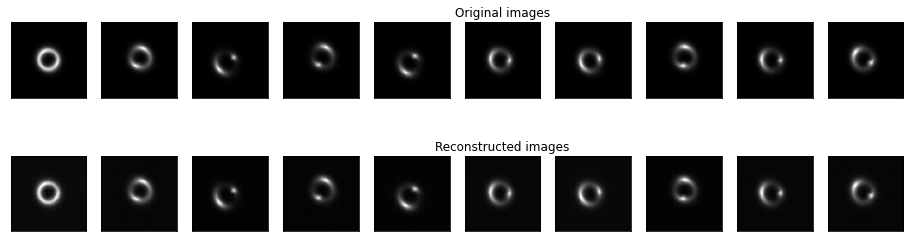

Epoch 107/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.991549936676437e-05, Val Recon loss: 3.833581568970759e-05, 
 Disc loss: 0.033535487949848175, Gen loss: 13.664851188659668

Epoch 108/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.211463130542695e-05, Val Recon loss: 4.193099852677228e-05, 
 Disc loss: 0.0430230051279068, Gen loss: 15.004854202270508

Epoch 109/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.0142386944662066e-05, Val Recon loss: 1.801295345810811e-05, 
 Disc loss: 0.036782845854759216, Gen loss: 14.3889741897583

New lower val loss. Saving model checkpoint!
Epoch 110/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.1224637938049735e-05, Val Recon loss: 2.4343046485834446e-05, 
 Disc loss: 0.043021801859140396, Gen loss: 16.054372787475586

Epoch 111/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.793728992537156e-05, Val Recon loss: 2.6881371417807208e-05, 
 Disc loss: 0.03170972317457199, Gen loss: 18.347715377807617



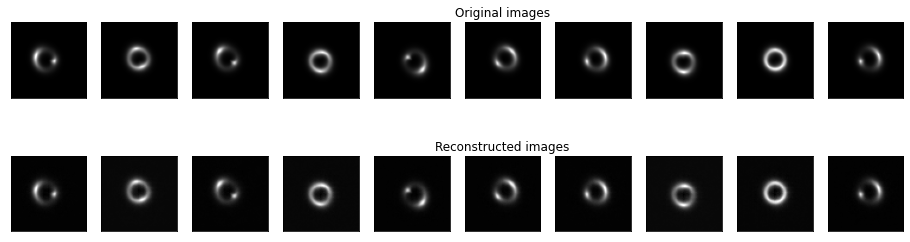

Epoch 112/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.7385970642061243e-05, Val Recon loss: 1.8564271562758626e-05, 
 Disc loss: 0.03731483966112137, Gen loss: 14.97004508972168

Epoch 113/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.963185890672389e-05, Val Recon loss: 1.8469556380296126e-05, 
 Disc loss: 0.03395039215683937, Gen loss: 15.338813781738281

Epoch 114/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.870681193055015e-05, Val Recon loss: 2.5327949414430703e-05, 
 Disc loss: 0.040576908737421036, Gen loss: 12.969426155090332

Epoch 115/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.130443100221825e-05, Val Recon loss: 2.374936149054621e-05, 
 Disc loss: 0.04052242264151573, Gen loss: 14.557060241699219

Epoch 116/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.0085078646509394e-05, Val Recon loss: 1.978438255415919e-05, 
 Disc loss: 0.0336369052529335, Gen loss: 14.933712005615234



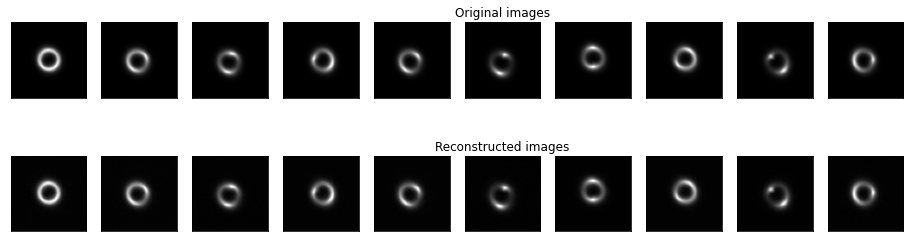

Epoch 117/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.6098380989866185e-05, Val Recon loss: 2.0087693378122316e-05, 
 Disc loss: 0.039305415004491806, Gen loss: 14.612393379211426

Epoch 118/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.9446301128683724e-05, Val Recon loss: 1.620008636867472e-05, 
 Disc loss: 0.039815474301576614, Gen loss: 14.513317108154297

New lower val loss. Saving model checkpoint!
Epoch 119/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.9109763388171634e-05, Val Recon loss: 2.451385989843402e-05, 
 Disc loss: 0.04355824366211891, Gen loss: 13.95962905883789

Epoch 120/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.733788045520881e-05, Val Recon loss: 2.7138816828179795e-05, 
 Disc loss: 0.03813091665506363, Gen loss: 15.282377243041992

Epoch 121/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.5594560160855414e-05, Val Recon loss: 1.7995981680643228e-05, 
 Disc loss: 0.035714562982320786, Gen loss: 14.348919868469238



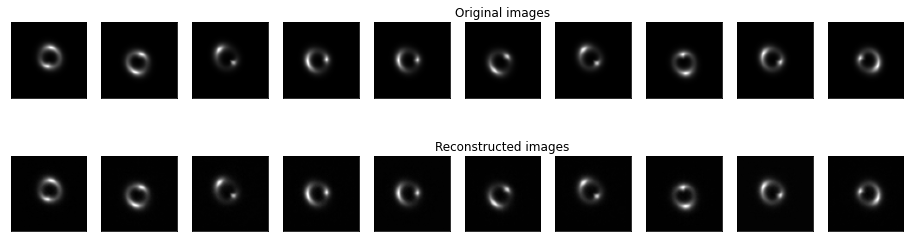

Epoch 122/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.9482939944245687e-05, Val Recon loss: 1.8527063730289228e-05, 
 Disc loss: 0.03762063384056091, Gen loss: 12.930859565734863

Epoch 123/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.7406808712669847e-05, Val Recon loss: 1.9510090876590563e-05, 
 Disc loss: 0.04017702117562294, Gen loss: 13.832529067993164

Epoch 124/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.5490621695345024e-05, Val Recon loss: 2.038170997467306e-05, 
 Disc loss: 0.04423541575670242, Gen loss: 14.103750228881836

Epoch 125/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.394503977807417e-05, Val Recon loss: 1.9769692597846086e-05, 
 Disc loss: 0.03902547061443329, Gen loss: 13.929203033447266

Epoch 126/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.5467333854007463e-05, Val Recon loss: 2.1215006806111585e-05, 
 Disc loss: 0.04576580226421356, Gen loss: 14.099590301513672



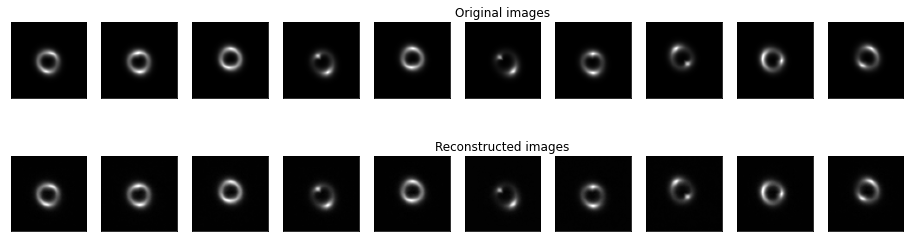

Epoch 127/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 3.130770171516483e-05, Val Recon loss: 2.783492285137375e-05, 
 Disc loss: 0.04303448647260666, Gen loss: 14.469925880432129

Epoch 128/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2294917717797978e-05, Val Recon loss: 1.567073882647997e-05, 
 Disc loss: 0.04096240922808647, Gen loss: 13.170303344726562

New lower val loss. Saving model checkpoint!
Epoch 129/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.609660983818396e-05, Val Recon loss: 2.3251189001409028e-05, 
 Disc loss: 0.04060057923197746, Gen loss: 13.361821174621582

Epoch 130/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.3944638342412718e-05, Val Recon loss: 2.0794515674222363e-05, 
 Disc loss: 0.044779568910598755, Gen loss: 11.537287712097168

Epoch 131/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.7357929942911277e-05, Val Recon loss: 1.4991803760090585e-05, 
 Disc loss: 0.04088808223605156, Gen loss: 12.356037139892578

New lower val loss. Saving model checkpoint!


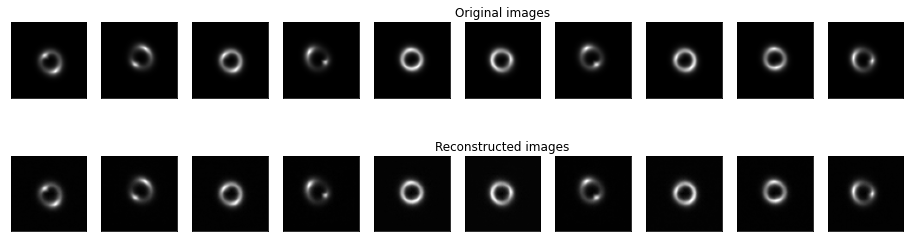

Epoch 132/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.810414354537209e-05, Val Recon loss: 1.7011851822543475e-05, 
 Disc loss: 0.04134543612599373, Gen loss: 10.738591194152832

Epoch 133/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.5841169870239855e-05, Val Recon loss: 3.209538125601183e-05, 
 Disc loss: 0.045528579503297806, Gen loss: 11.882551193237305

Epoch 134/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.481158569204364e-05, Val Recon loss: 1.9079868959832107e-05, 
 Disc loss: 0.04487176612019539, Gen loss: 12.83067798614502

Epoch 135/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2998401584679253e-05, Val Recon loss: 1.5238836668787473e-05, 
 Disc loss: 0.04420633986592293, Gen loss: 13.76845932006836

Epoch 136/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.417263962019988e-05, Val Recon loss: 1.658204322059949e-05, 
 Disc loss: 0.04783691093325615, Gen loss: 12.3603515625



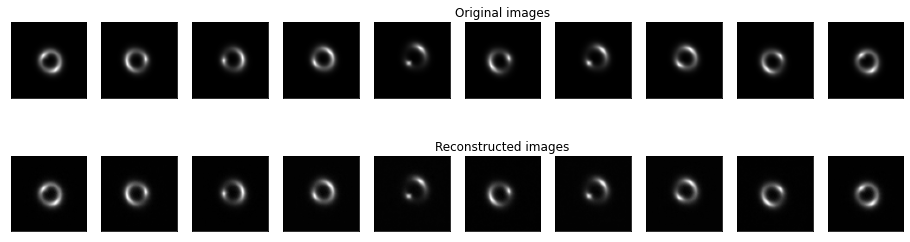

Epoch 137/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.5325210380942395e-05, Val Recon loss: 2.2561206909207005e-05, 
 Disc loss: 0.04578143358230591, Gen loss: 12.539462089538574

Epoch 138/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.399670040312715e-05, Val Recon loss: 1.8244646222835097e-05, 
 Disc loss: 0.045958805829286575, Gen loss: 13.344674110412598

Epoch 139/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.198935292135417e-05, Val Recon loss: 1.6753397075161855e-05, 
 Disc loss: 0.04606722295284271, Gen loss: 14.050500869750977

Epoch 140/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.225494409966278e-05, Val Recon loss: 1.983063985891123e-05, 
 Disc loss: 0.038118958473205566, Gen loss: 16.122482299804688

Epoch 141/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.4076858302170332e-05, Val Recon loss: 1.6669357137288898e-05, 
 Disc loss: 0.05642565339803696, Gen loss: 14.56326961517334



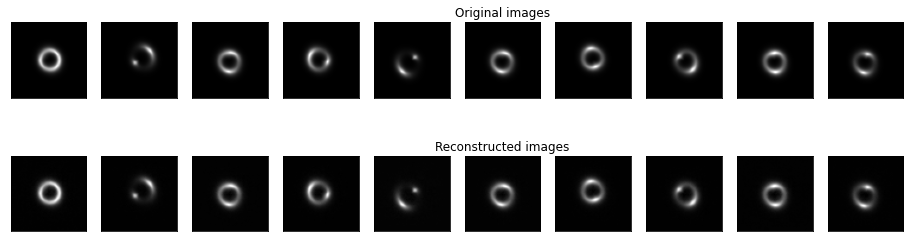

Epoch 142/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2370218175638e-05, Val Recon loss: 2.144203750099728e-05, 
 Disc loss: 0.04733976349234581, Gen loss: 12.96360969543457

Epoch 143/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.214843254614182e-05, Val Recon loss: 2.0537637990653617e-05, 
 Disc loss: 0.047098372131586075, Gen loss: 11.783453941345215

Epoch 144/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1467822335010924e-05, Val Recon loss: 2.019054611284648e-05, 
 Disc loss: 0.04721711203455925, Gen loss: 12.211786270141602

Epoch 145/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1867817305855314e-05, Val Recon loss: 2.648188294390113e-05, 
 Disc loss: 0.05265767499804497, Gen loss: 11.502900123596191

Epoch 146/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.292326450438748e-05, Val Recon loss: 1.80083655626125e-05, 
 Disc loss: 0.049106165766716, Gen loss: 11.216937065124512



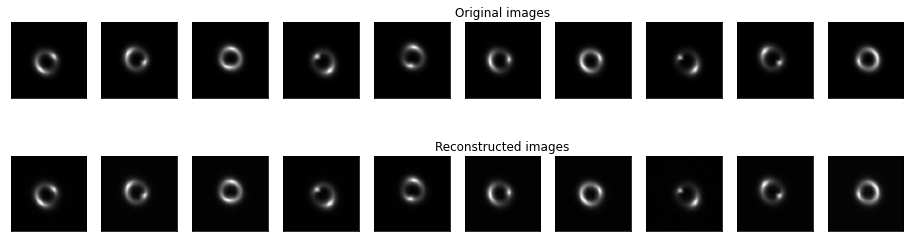

Epoch 147/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.386233310937875e-05, Val Recon loss: 1.9980369971664106e-05, 
 Disc loss: 0.04882228001952171, Gen loss: 12.070279121398926

Epoch 148/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9741310956237826e-05, Val Recon loss: 2.161768578743148e-05, 
 Disc loss: 0.05240049585700035, Gen loss: 13.813483238220215

Epoch 149/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.3286263177252405e-05, Val Recon loss: 2.0323085563076245e-05, 
 Disc loss: 0.04325219243764877, Gen loss: 12.600842475891113

Epoch 150/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.0254117091405033e-05, Val Recon loss: 1.2846167515413577e-05, 
 Disc loss: 0.05585109069943428, Gen loss: 12.317839622497559

New lower val loss. Saving model checkpoint!
Epoch 151/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9986816173556445e-05, Val Recon loss: 1.2604067908089039e-05, 
 Disc loss: 0.04610297456383705, Gen loss: 12.029025077819824

New lower val loss. Saving model checkpoint!


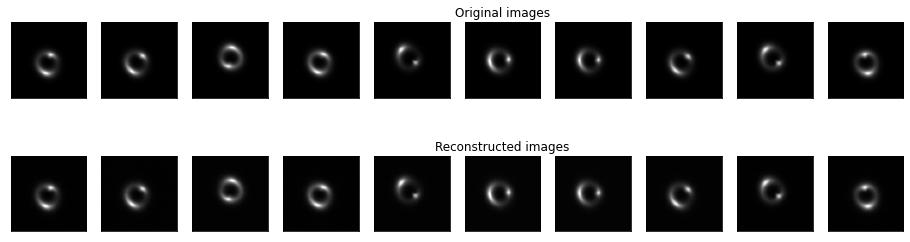

Epoch 152/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2391785465498568e-05, Val Recon loss: 1.4237944722279079e-05, 
 Disc loss: 0.05669171363115311, Gen loss: 12.497734069824219

Epoch 153/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9613701905119537e-05, Val Recon loss: 1.8075260716917303e-05, 
 Disc loss: 0.050742533057928085, Gen loss: 12.184748649597168

Epoch 154/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2385364305404792e-05, Val Recon loss: 2.151567140471242e-05, 
 Disc loss: 0.05296768248081207, Gen loss: 12.13620376586914

Epoch 155/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.0766827967627166e-05, Val Recon loss: 1.555234980009522e-05, 
 Disc loss: 0.04794195666909218, Gen loss: 11.053731918334961

Epoch 156/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.0621128735392546e-05, Val Recon loss: 1.924947941410614e-05, 
 Disc loss: 0.04975137487053871, Gen loss: 12.094588279724121



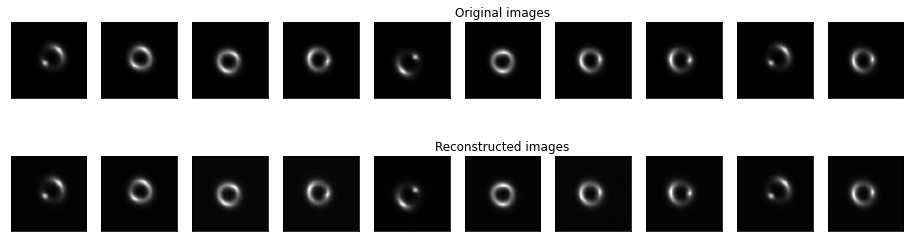

Epoch 157/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.0177937560186015e-05, Val Recon loss: 1.6977115188233762e-05, 
 Disc loss: 0.04530280828475952, Gen loss: 12.56557846069336

Epoch 158/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1430648099068034e-05, Val Recon loss: 2.1361213132169927e-05, 
 Disc loss: 0.05731942877173424, Gen loss: 12.363734245300293

Epoch 159/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.0186770793728347e-05, Val Recon loss: 1.7061943961178055e-05, 
 Disc loss: 0.0542638897895813, Gen loss: 11.234435081481934

Epoch 160/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.1690595165756204e-05, Val Recon loss: 1.73512253240915e-05, 
 Disc loss: 0.05297764390707016, Gen loss: 10.257916450500488

Epoch 161/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.06123523410191e-05, Val Recon loss: 1.6078252883744426e-05, 
 Disc loss: 0.04725043103098869, Gen loss: 10.561115264892578



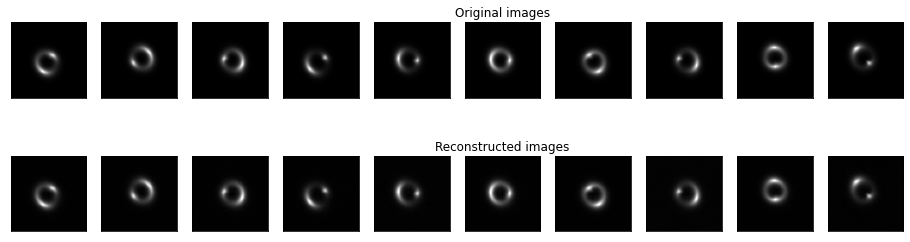

Epoch 162/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.017827962369334e-05, Val Recon loss: 1.4363041575254303e-05, 
 Disc loss: 0.04556538537144661, Gen loss: 11.279706001281738

Epoch 163/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8644511141603764e-05, Val Recon loss: 1.338937798007262e-05, 
 Disc loss: 0.049036018550395966, Gen loss: 10.498702049255371

Epoch 164/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8504712200997217e-05, Val Recon loss: 2.2722311971139992e-05, 
 Disc loss: 0.05272245779633522, Gen loss: 11.588254928588867

Epoch 165/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.2094770769246475e-05, Val Recon loss: 3.371695816491006e-05, 
 Disc loss: 0.04941992089152336, Gen loss: 10.175840377807617

Epoch 166/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8175956556150825e-05, Val Recon loss: 1.1522765210732663e-05, 
 Disc loss: 0.05256989598274231, Gen loss: 10.08414363861084

New lower val loss. Saving model checkpoint!


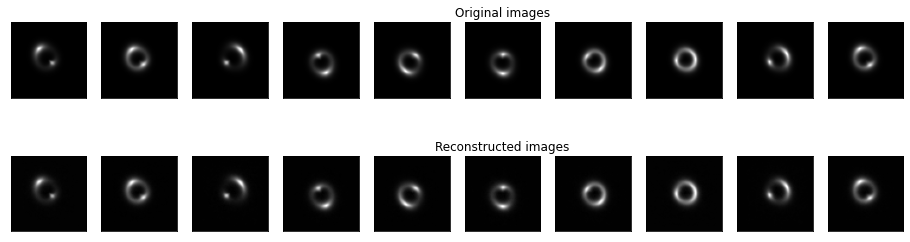

Epoch 167/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8801592589531717e-05, Val Recon loss: 4.151674632642729e-05, 
 Disc loss: 0.052478622645139694, Gen loss: 11.130046844482422

Epoch 168/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.0628185980780828e-05, Val Recon loss: 1.5241171846961757e-05, 
 Disc loss: 0.05461551621556282, Gen loss: 11.66923999786377

Epoch 169/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.967974871336635e-05, Val Recon loss: 1.3422778667720397e-05, 
 Disc loss: 0.05459871143102646, Gen loss: 10.605025291442871

Epoch 170/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9697983249141748e-05, Val Recon loss: 1.9235752511627248e-05, 
 Disc loss: 0.05470497906208038, Gen loss: 10.667841911315918

Epoch 171/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.911222876243241e-05, Val Recon loss: 2.347838805386952e-05, 
 Disc loss: 0.04952625185251236, Gen loss: 10.56728744506836



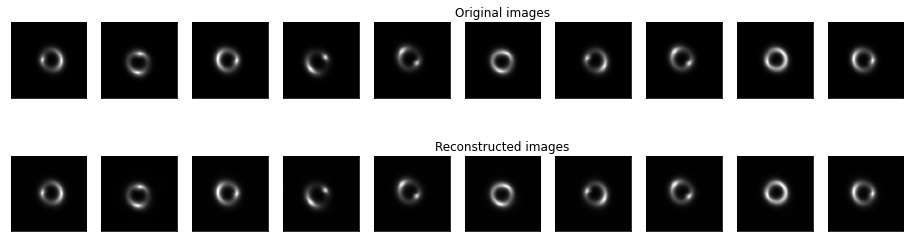

Epoch 172/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9853869077034738e-05, Val Recon loss: 2.3749757828126247e-05, 
 Disc loss: 0.045887988060712814, Gen loss: 9.905138969421387

Epoch 173/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7734861842731435e-05, Val Recon loss: 2.0786027057005816e-05, 
 Disc loss: 0.051193058490753174, Gen loss: 10.076431274414062

Epoch 174/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8595611716965518e-05, Val Recon loss: 1.249049586880978e-05, 
 Disc loss: 0.04493510350584984, Gen loss: 9.76894474029541

Epoch 175/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8219029179732882e-05, Val Recon loss: 1.783578793240142e-05, 
 Disc loss: 0.05486207455396652, Gen loss: 9.53563404083252

Epoch 176/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9152867102195295e-05, Val Recon loss: 1.3653713520195904e-05, 
 Disc loss: 0.047078654170036316, Gen loss: 10.417470932006836



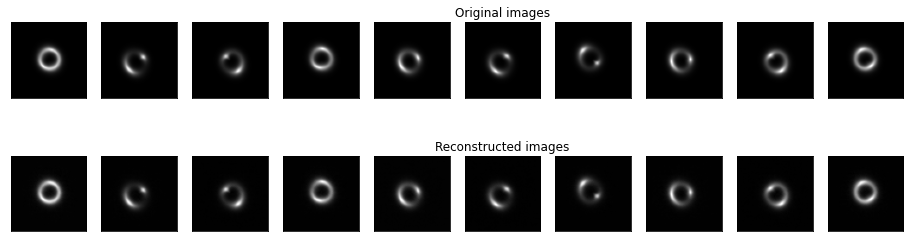

Epoch 177/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 2.010121907260667e-05, Val Recon loss: 1.3387320602002243e-05, 
 Disc loss: 0.05110498145222664, Gen loss: 9.698066711425781

Epoch 178/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.9694773412840527e-05, Val Recon loss: 1.6013791335151633e-05, 
 Disc loss: 0.051317449659109116, Gen loss: 11.114988327026367

Epoch 179/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7378514704118246e-05, Val Recon loss: 1.1554172184939185e-05, 
 Disc loss: 0.06077318638563156, Gen loss: 11.223649978637695

Epoch 180/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.905142811512429e-05, Val Recon loss: 1.2398228540809618e-05, 
 Disc loss: 0.05166187882423401, Gen loss: 9.795652389526367

Epoch 181/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.670325615531145e-05, Val Recon loss: 1.4916487594342067e-05, 
 Disc loss: 0.05610112100839615, Gen loss: 10.958356857299805



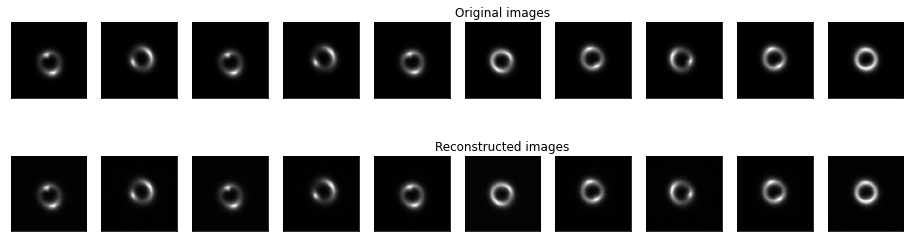

Epoch 182/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.963249620513405e-05, Val Recon loss: 1.8406923724493634e-05, 
 Disc loss: 0.052357111126184464, Gen loss: 11.40162467956543

Epoch 183/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.646041215349002e-05, Val Recon loss: 1.2374705875117797e-05, 
 Disc loss: 0.054720308631658554, Gen loss: 10.288917541503906

Epoch 184/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.750282686244246e-05, Val Recon loss: 1.3161592505639419e-05, 
 Disc loss: 0.0616924874484539, Gen loss: 11.14022159576416

Epoch 185/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.820415538837959e-05, Val Recon loss: 1.0582963214902622e-05, 
 Disc loss: 0.05038517341017723, Gen loss: 10.655922889709473

New lower val loss. Saving model checkpoint!
Epoch 186/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8010654848609687e-05, Val Recon loss: 1.3921699367832238e-05, 
 Disc loss: 0.06481703370809555, Gen loss: 12.848238945007324



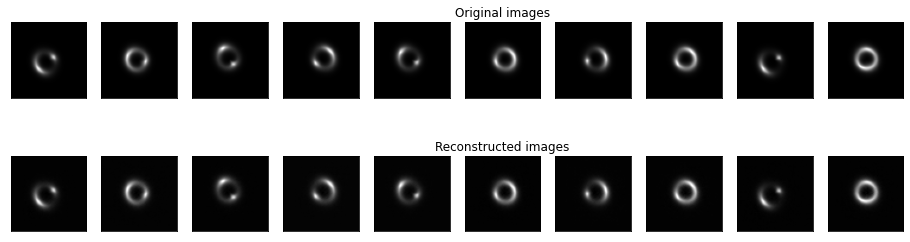

Epoch 187/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6377273899808778e-05, Val Recon loss: 1.3020830920140725e-05, 
 Disc loss: 0.05830748379230499, Gen loss: 12.32005500793457

Epoch 188/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8563214665693317e-05, Val Recon loss: 1.4465821752512258e-05, 
 Disc loss: 0.0639452338218689, Gen loss: 11.045560836791992

Epoch 189/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.795833672688693e-05, Val Recon loss: 1.335313461620697e-05, 
 Disc loss: 0.06382624804973602, Gen loss: 11.519184112548828

Epoch 190/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7555260532492092e-05, Val Recon loss: 1.231479857071665e-05, 
 Disc loss: 0.06251097470521927, Gen loss: 11.412723541259766

Epoch 191/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5931840114666487e-05, Val Recon loss: 1.3358463345664657e-05, 
 Disc loss: 0.060599375516176224, Gen loss: 10.321808815002441



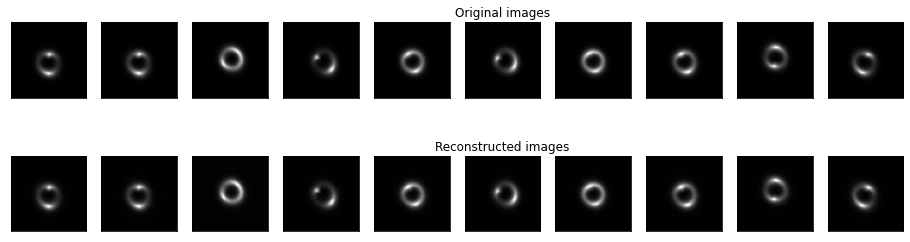

Epoch 192/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.843065062794012e-05, Val Recon loss: 1.5988322856072853e-05, 
 Disc loss: 0.05790591612458229, Gen loss: 11.507887840270996

Epoch 193/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.8370236966377624e-05, Val Recon loss: 1.4627323758355084e-05, 
 Disc loss: 0.06655211001634598, Gen loss: 11.1265869140625

Epoch 194/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7100738294294243e-05, Val Recon loss: 1.8732948673358704e-05, 
 Disc loss: 0.0674472227692604, Gen loss: 10.860625267028809

Epoch 195/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6807414021543727e-05, Val Recon loss: 2.4035838780239122e-05, 
 Disc loss: 0.07119417190551758, Gen loss: 10.950691223144531

Epoch 196/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7092869524633463e-05, Val Recon loss: 1.3993961955647035e-05, 
 Disc loss: 0.07072579860687256, Gen loss: 11.59170150756836



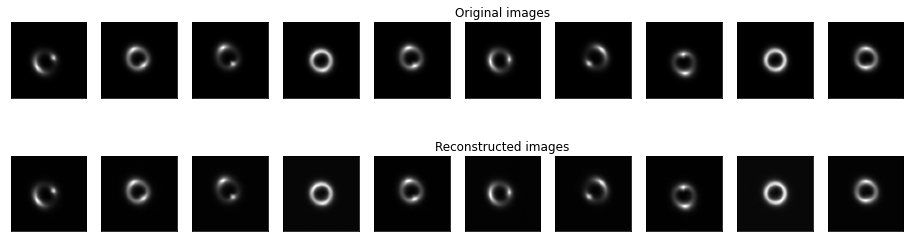

Epoch 197/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.7465327256894997e-05, Val Recon loss: 1.3901825089609096e-05, 
 Disc loss: 0.06665698438882828, Gen loss: 11.732932090759277

Epoch 198/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4998707365096117e-05, Val Recon loss: 1.0299942409296313e-05, 
 Disc loss: 0.06906072050333023, Gen loss: 10.460548400878906

New lower val loss. Saving model checkpoint!
Epoch 199/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6574606174757055e-05, Val Recon loss: 3.0313416977555284e-05, 
 Disc loss: 0.07555956393480301, Gen loss: 11.292716979980469

Epoch 200/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.701156641026169e-05, Val Recon loss: 1.5617964790079794e-05, 
 Disc loss: 0.06432139128446579, Gen loss: 10.58164119720459

Epoch 201/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.662575643728313e-05, Val Recon loss: 1.727270783804771e-05, 
 Disc loss: 0.06386574357748032, Gen loss: 10.522878646850586



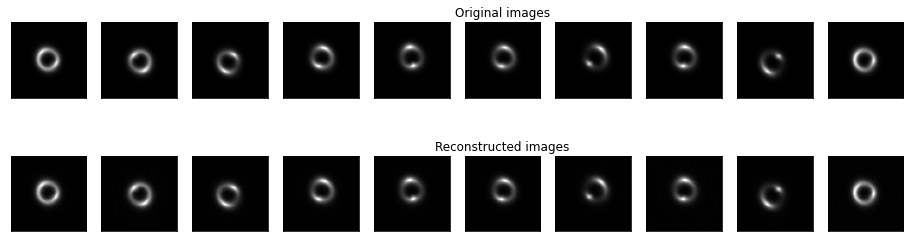

Epoch 202/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6023637412404795e-05, Val Recon loss: 1.0179553909337199e-05, 
 Disc loss: 0.06644982099533081, Gen loss: 11.288056373596191

New lower val loss. Saving model checkpoint!
Epoch 203/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4506669362944934e-05, Val Recon loss: 1.2404429273576372e-05, 
 Disc loss: 0.06864514201879501, Gen loss: 10.163962364196777

Epoch 204/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5204980627459008e-05, Val Recon loss: 1.9926937764264745e-05, 
 Disc loss: 0.06534312665462494, Gen loss: 10.47783374786377

Epoch 205/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5341184293009694e-05, Val Recon loss: 8.835245858386366e-06, 
 Disc loss: 0.06743360310792923, Gen loss: 12.052967071533203

New lower val loss. Saving model checkpoint!
Epoch 206/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6298227428791012e-05, Val Recon loss: 9.753817721502855e-06, 
 Disc loss: 0.06769687682390213, Gen loss: 10.301812171936035



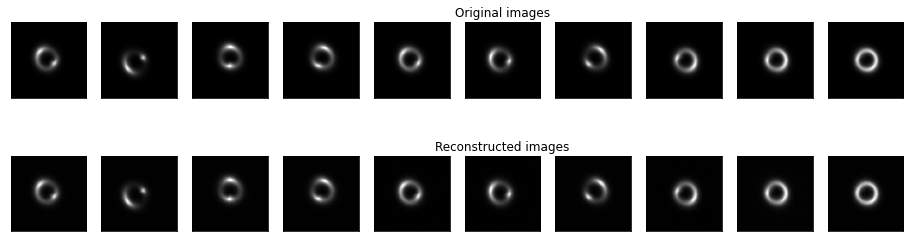

Epoch 207/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5961007414253485e-05, Val Recon loss: 2.210506115968908e-05, 
 Disc loss: 0.06576476246118546, Gen loss: 11.427738189697266

Epoch 208/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5857468199917273e-05, Val Recon loss: 1.1245059795328416e-05, 
 Disc loss: 0.07030417770147324, Gen loss: 11.0300931930542

Epoch 209/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.408204765556267e-05, Val Recon loss: 1.2975487758618934e-05, 
 Disc loss: 0.06830884516239166, Gen loss: 10.332883834838867

Epoch 210/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.6200375930821223e-05, Val Recon loss: 9.47678149208918e-06, 
 Disc loss: 0.07152438163757324, Gen loss: 10.517484664916992

Epoch 211/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.548569767165246e-05, Val Recon loss: 1.490705037415157e-05, 
 Disc loss: 0.07349523901939392, Gen loss: 11.689104080200195



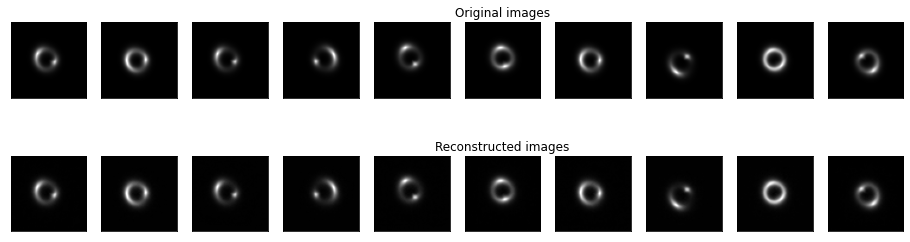

Epoch 212/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.513112478720342e-05, Val Recon loss: 1.7765173955316033e-05, 
 Disc loss: 0.06852283328771591, Gen loss: 10.488567352294922

Epoch 213/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5026274030507546e-05, Val Recon loss: 1.1025257562222476e-05, 
 Disc loss: 0.07941022515296936, Gen loss: 10.505913734436035

Epoch 214/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4268248395357285e-05, Val Recon loss: 1.4060360727954605e-05, 
 Disc loss: 0.06787196546792984, Gen loss: 11.537954330444336

Epoch 215/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5819615829424828e-05, Val Recon loss: 1.3717622298119952e-05, 
 Disc loss: 0.08127100020647049, Gen loss: 10.825159072875977

Epoch 216/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4337846703914965e-05, Val Recon loss: 1.537440928384765e-05, 
 Disc loss: 0.06502079218626022, Gen loss: 10.5690336227417



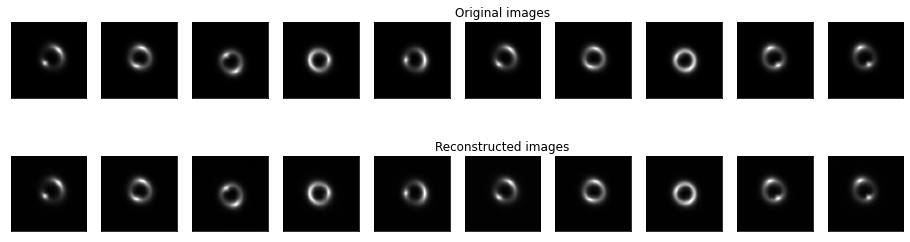

Epoch 217/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5083807772846902e-05, Val Recon loss: 1.2977517750793291e-05, 
 Disc loss: 0.06726177781820297, Gen loss: 9.470935821533203

Epoch 218/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4312083685496456e-05, Val Recon loss: 1.1347932336826085e-05, 
 Disc loss: 0.06704173237085342, Gen loss: 9.112064361572266

Epoch 219/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4619812815832017e-05, Val Recon loss: 8.750512582385758e-06, 
 Disc loss: 0.06311868876218796, Gen loss: 8.84579849243164

New lower val loss. Saving model checkpoint!
Epoch 220/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4146392314725285e-05, Val Recon loss: 1.2621953929839139e-05, 
 Disc loss: 0.06628471612930298, Gen loss: 9.837554931640625

Epoch 221/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.363443609810691e-05, Val Recon loss: 1.2969402026404472e-05, 
 Disc loss: 0.07098399102687836, Gen loss: 10.000198364257812



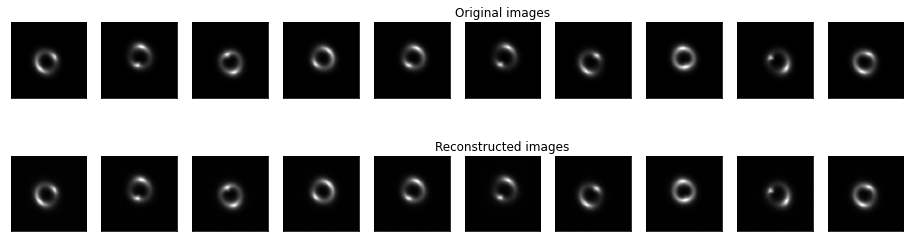

Epoch 222/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4500130461537058e-05, Val Recon loss: 7.97574112867652e-06, 
 Disc loss: 0.062162335962057114, Gen loss: 8.910065650939941

New lower val loss. Saving model checkpoint!
Epoch 223/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.5862196637371938e-05, Val Recon loss: 1.0818435132225406e-05, 
 Disc loss: 0.0683755949139595, Gen loss: 10.09685230255127

Epoch 224/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3876662051528758e-05, Val Recon loss: 1.0149116557537733e-05, 
 Disc loss: 0.06641186773777008, Gen loss: 9.961108207702637

Epoch 225/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4554750454850347e-05, Val Recon loss: 1.7872803154103975e-05, 
 Disc loss: 0.06582077592611313, Gen loss: 9.426244735717773

Epoch 226/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3321662740156306e-05, Val Recon loss: 1.9064060729255692e-05, 
 Disc loss: 0.06809382140636444, Gen loss: 10.012608528137207



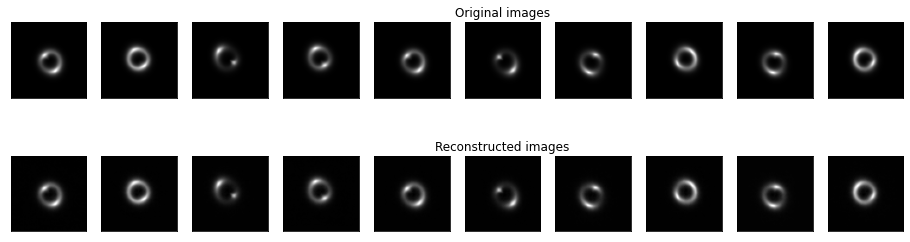

Epoch 227/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.456713172072375e-05, Val Recon loss: 1.1985620706885433e-05, 
 Disc loss: 0.07281264662742615, Gen loss: 10.465604782104492

Epoch 228/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4640053339921608e-05, Val Recon loss: 1.5030192419847785e-05, 
 Disc loss: 0.06458920240402222, Gen loss: 9.29167652130127

Epoch 229/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4107721704999464e-05, Val Recon loss: 7.719164740491477e-06, 
 Disc loss: 0.06977641582489014, Gen loss: 9.14592456817627

New lower val loss. Saving model checkpoint!
Epoch 230/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1650597532883626e-05, Val Recon loss: 7.582029108258818e-06, 
 Disc loss: 0.06646928936243057, Gen loss: 9.318108558654785

New lower val loss. Saving model checkpoint!
Epoch 231/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3572463137628054e-05, Val Recon loss: 9.77093835293393e-06, 
 Disc loss: 0.06291670352220535, Gen loss: 9.106066703796387



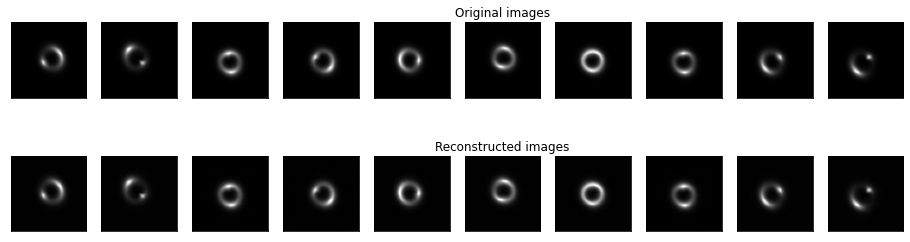

Epoch 232/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3035605449072264e-05, Val Recon loss: 9.501653645808497e-06, 
 Disc loss: 0.0715978816151619, Gen loss: 10.616828918457031

Epoch 233/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3751816427812228e-05, Val Recon loss: 1.515705298515968e-05, 
 Disc loss: 0.06991938501596451, Gen loss: 10.473822593688965

Epoch 234/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.332271574802205e-05, Val Recon loss: 8.253933426911115e-06, 
 Disc loss: 0.06928937882184982, Gen loss: 9.413487434387207

Epoch 235/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.4022884455715659e-05, Val Recon loss: 1.1630850167421158e-05, 
 Disc loss: 0.06908002495765686, Gen loss: 10.393132209777832

Epoch 236/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.264563322884072e-05, Val Recon loss: 1.0067083268141789e-05, 
 Disc loss: 0.0670236274600029, Gen loss: 9.971267700195312



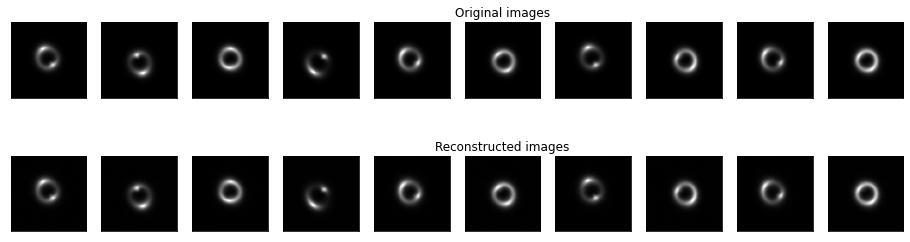

Epoch 237/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3542643543340975e-05, Val Recon loss: 8.499321969187198e-06, 
 Disc loss: 0.06331323832273483, Gen loss: 9.90196704864502

Epoch 238/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3738162481352779e-05, Val Recon loss: 9.605780178389978e-06, 
 Disc loss: 0.06528487801551819, Gen loss: 9.884234428405762

Epoch 239/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.228588528553879e-05, Val Recon loss: 9.516195354485211e-06, 
 Disc loss: 0.07085458189249039, Gen loss: 9.786640167236328

Epoch 240/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2582090344507396e-05, Val Recon loss: 1.0824853436335818e-05, 
 Disc loss: 0.06421829760074615, Gen loss: 9.628273963928223

Epoch 241/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2869704920019536e-05, Val Recon loss: 1.11391191239818e-05, 
 Disc loss: 0.06120980903506279, Gen loss: 9.72256088256836



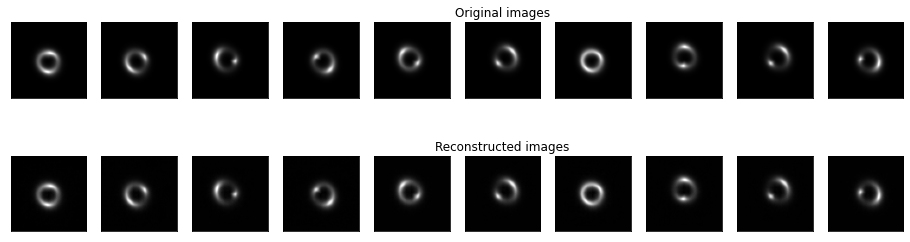

Epoch 242/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2656860787934997e-05, Val Recon loss: 1.2818307873708869e-05, 
 Disc loss: 0.0712592601776123, Gen loss: 10.473711967468262

Epoch 243/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2721006327257578e-05, Val Recon loss: 1.2302392759819566e-05, 
 Disc loss: 0.06936225295066833, Gen loss: 10.627052307128906

Epoch 244/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2483985293014672e-05, Val Recon loss: 8.065967146346035e-06, 
 Disc loss: 0.07209637761116028, Gen loss: 10.437162399291992

Epoch 245/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2113793588052481e-05, Val Recon loss: 1.1733612559004945e-05, 
 Disc loss: 0.0674293115735054, Gen loss: 9.613027572631836

Epoch 246/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.376773654607018e-05, Val Recon loss: 1.6356420827732007e-05, 
 Disc loss: 0.06545493751764297, Gen loss: 9.441438674926758



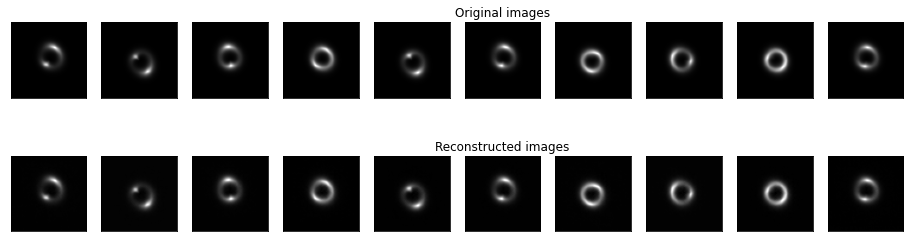

Epoch 247/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2094401750018903e-05, Val Recon loss: 1.0132637220926375e-05, 
 Disc loss: 0.06711120158433914, Gen loss: 9.6570405960083

Epoch 248/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2458080350922933e-05, Val Recon loss: 8.39165012520324e-06, 
 Disc loss: 0.07069790363311768, Gen loss: 9.677871704101562

Epoch 249/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2350374843357305e-05, Val Recon loss: 1.1413673443409303e-05, 
 Disc loss: 0.07287023961544037, Gen loss: 9.576745986938477

Epoch 250/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2389215851590477e-05, Val Recon loss: 9.058593301839816e-06, 
 Disc loss: 0.06723698228597641, Gen loss: 9.575437545776367

Epoch 251/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2553120949267515e-05, Val Recon loss: 1.0308205876046688e-05, 
 Disc loss: 0.0683894008398056, Gen loss: 9.297159194946289



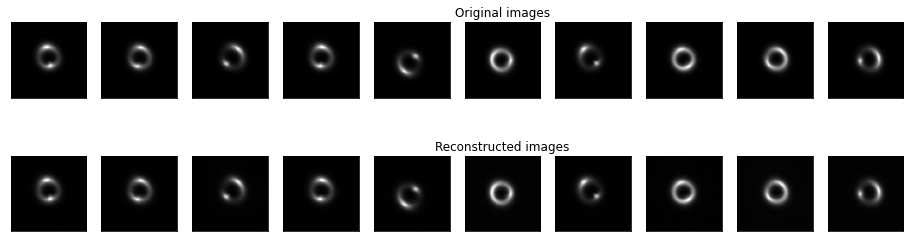

Epoch 252/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1608632665348378e-05, Val Recon loss: 1.2292979186491317e-05, 
 Disc loss: 0.06500306725502014, Gen loss: 9.113699913024902

Epoch 253/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1404946715663193e-05, Val Recon loss: 7.33126681653731e-06, 
 Disc loss: 0.06196918711066246, Gen loss: 8.709199905395508

New lower val loss. Saving model checkpoint!
Epoch 254/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.229380058392852e-05, Val Recon loss: 9.326256784131854e-06, 
 Disc loss: 0.05617601051926613, Gen loss: 9.32674789428711

Epoch 255/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.3001961370064577e-05, Val Recon loss: 1.2580363646621765e-05, 
 Disc loss: 0.057534217834472656, Gen loss: 9.426989555358887

Epoch 256/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1471530521031747e-05, Val Recon loss: 8.14929505092247e-06, 
 Disc loss: 0.06474916636943817, Gen loss: 9.065979957580566



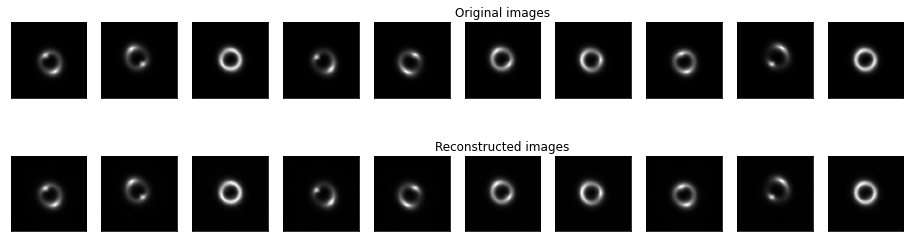

Epoch 257/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1685849394525236e-05, Val Recon loss: 7.673017434070869e-06, 
 Disc loss: 0.06601692736148834, Gen loss: 9.30517292022705

Epoch 258/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1043733946144555e-05, Val Recon loss: 6.733578983484121e-06, 
 Disc loss: 0.06752000004053116, Gen loss: 9.288712501525879

New lower val loss. Saving model checkpoint!
Epoch 259/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1233872288000817e-05, Val Recon loss: 5.850372872373555e-06, 
 Disc loss: 0.06551282107830048, Gen loss: 9.61612606048584

New lower val loss. Saving model checkpoint!
Epoch 260/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1699914079841942e-05, Val Recon loss: 1.025133537445476e-05, 
 Disc loss: 0.06681341677904129, Gen loss: 10.666864395141602

Epoch 261/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1542623945379686e-05, Val Recon loss: 8.836186174853032e-06, 
 Disc loss: 0.06166274473071098, Gen loss: 9.329361915588379



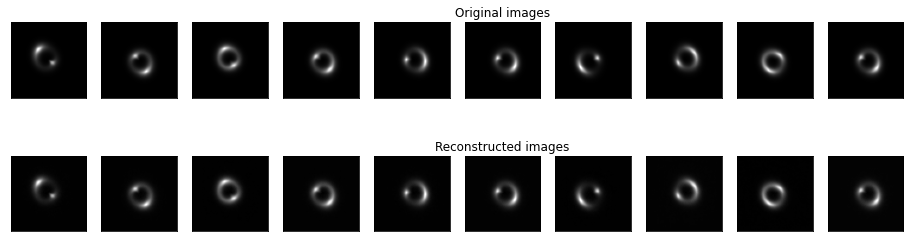

Epoch 262/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1006100806374991e-05, Val Recon loss: 7.71668363894504e-06, 
 Disc loss: 0.06694066524505615, Gen loss: 9.650303840637207

Epoch 263/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.152905561892146e-05, Val Recon loss: 7.84121018821477e-06, 
 Disc loss: 0.0696324035525322, Gen loss: 9.942057609558105

Epoch 264/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1903069063120251e-05, Val Recon loss: 7.320641139409014e-06, 
 Disc loss: 0.0607425794005394, Gen loss: 9.008562088012695

Epoch 265/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0737084122521532e-05, Val Recon loss: 1.103121889577273e-05, 
 Disc loss: 0.06766335666179657, Gen loss: 10.523801803588867

Epoch 266/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.055614551932254e-05, Val Recon loss: 8.571627505362914e-06, 
 Disc loss: 0.06951571255922318, Gen loss: 9.552340507507324



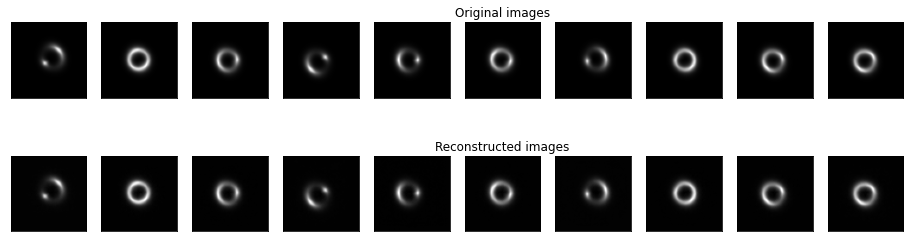

Epoch 267/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.173993369545918e-05, Val Recon loss: 6.723063759434606e-06, 
 Disc loss: 0.058887042105197906, Gen loss: 9.330785751342773

Epoch 268/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1188260346711461e-05, Val Recon loss: 9.881497640486083e-06, 
 Disc loss: 0.07056207209825516, Gen loss: 9.630598068237305

Epoch 269/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1445550668876397e-05, Val Recon loss: 7.76654415959557e-06, 
 Disc loss: 0.0698433667421341, Gen loss: 10.30482006072998

Epoch 270/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.129068749552597e-05, Val Recon loss: 9.864831958515828e-06, 
 Disc loss: 0.06762289255857468, Gen loss: 9.748274803161621

Epoch 271/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1376399219715555e-05, Val Recon loss: 9.057594777712236e-06, 
 Disc loss: 0.0633370652794838, Gen loss: 9.262969017028809



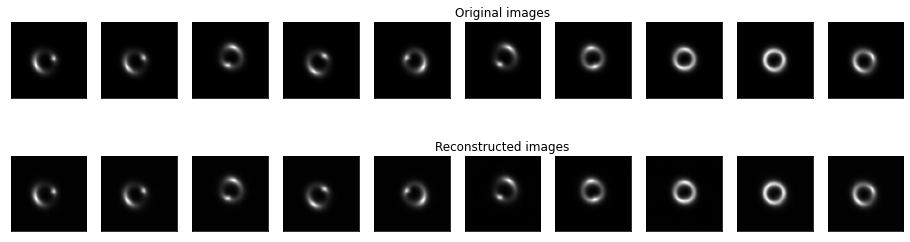

Epoch 272/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.116051327835096e-05, Val Recon loss: 9.064920858589983e-06, 
 Disc loss: 0.06030258908867836, Gen loss: 9.237125396728516

Epoch 273/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0464533643754064e-05, Val Recon loss: 1.0163480207362833e-05, 
 Disc loss: 0.05844370648264885, Gen loss: 9.185224533081055

Epoch 274/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2030824559885425e-05, Val Recon loss: 6.447471656024896e-06, 
 Disc loss: 0.06127100810408592, Gen loss: 9.968912124633789

Epoch 275/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1240987035554124e-05, Val Recon loss: 6.53324241284281e-06, 
 Disc loss: 0.059239428490400314, Gen loss: 9.580759048461914

Epoch 276/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1325206559436465e-05, Val Recon loss: 7.5089307958680565e-06, 
 Disc loss: 0.06496550887823105, Gen loss: 9.563924789428711



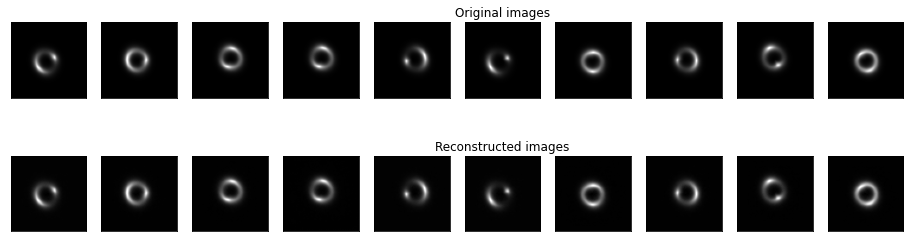

Epoch 277/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.2004767256181265e-05, Val Recon loss: 1.1444017117254487e-05, 
 Disc loss: 0.060733117163181305, Gen loss: 9.165865898132324

Epoch 278/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0481443721495045e-05, Val Recon loss: 6.853082646153376e-06, 
 Disc loss: 0.06370005011558533, Gen loss: 9.337414741516113

Epoch 279/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1235019730316436e-05, Val Recon loss: 8.535687003232953e-06, 
 Disc loss: 0.062027644366025925, Gen loss: 9.6043701171875

Epoch 280/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0629476372886419e-05, Val Recon loss: 1.1645710098188525e-05, 
 Disc loss: 0.053221769630908966, Gen loss: 9.55693244934082

Epoch 281/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1224226051194606e-05, Val Recon loss: 8.832569922863817e-06, 
 Disc loss: 0.05954263359308243, Gen loss: 9.788318634033203



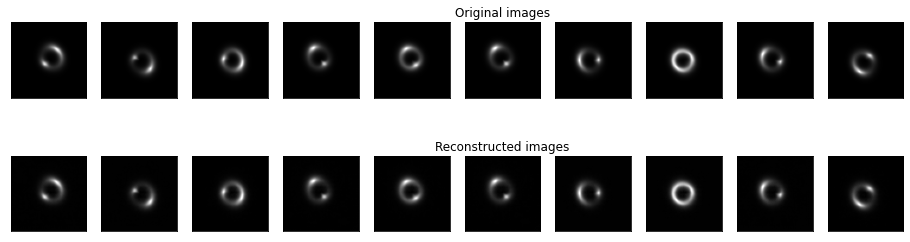

Epoch 282/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0862572686742636e-05, Val Recon loss: 6.85187791936591e-06, 
 Disc loss: 0.06372377276420593, Gen loss: 10.140432357788086

Epoch 283/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1904448103586704e-05, Val Recon loss: 6.906785984028829e-06, 
 Disc loss: 0.059425391256809235, Gen loss: 9.518802642822266

Epoch 284/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1944217178913455e-05, Val Recon loss: 1.030074316885374e-05, 
 Disc loss: 0.05836981534957886, Gen loss: 9.223306655883789

Epoch 285/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.061771020592978e-05, Val Recon loss: 8.177476451641673e-06, 
 Disc loss: 0.06157558038830757, Gen loss: 9.516772270202637

Epoch 286/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.028365667369603e-05, Val Recon loss: 8.209799792287717e-06, 
 Disc loss: 0.053179122507572174, Gen loss: 8.989538192749023



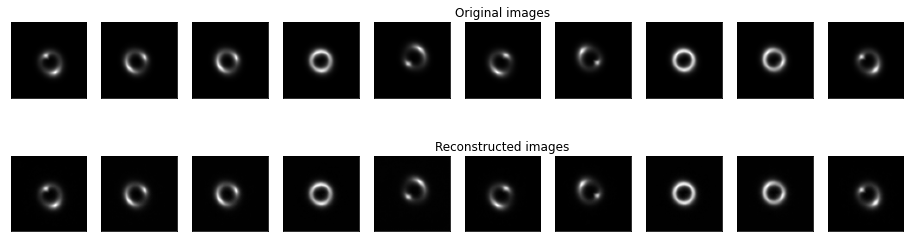

Epoch 287/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.927400488802994e-06, Val Recon loss: 5.298385025930151e-06, 
 Disc loss: 0.05698201805353165, Gen loss: 8.753783226013184

New lower val loss. Saving model checkpoint!
Epoch 288/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.047068640941136e-05, Val Recon loss: 1.3779219039457126e-05, 
 Disc loss: 0.05501013994216919, Gen loss: 9.281981468200684

Epoch 289/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0454116197940501e-05, Val Recon loss: 6.3048321155494905e-06, 
 Disc loss: 0.06074699014425278, Gen loss: 9.531123161315918

Epoch 290/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0158123875732607e-05, Val Recon loss: 6.511772123000507e-06, 
 Disc loss: 0.06509779393672943, Gen loss: 8.842941284179688

Epoch 291/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0204931131058707e-05, Val Recon loss: 7.844442835549773e-06, 
 Disc loss: 0.05695643648505211, Gen loss: 10.907588958740234



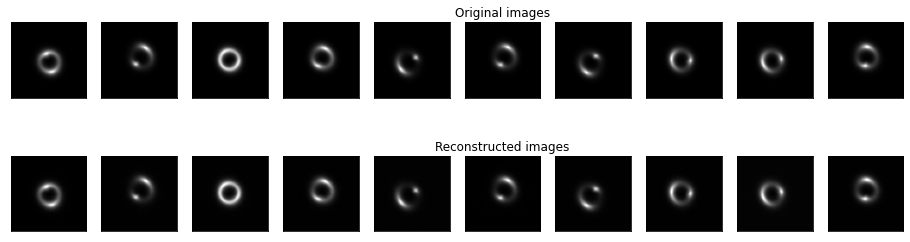

Epoch 292/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.825837559704006e-06, Val Recon loss: 6.889749480857669e-06, 
 Disc loss: 0.059797972440719604, Gen loss: 9.635486602783203

Epoch 293/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.684862238700419e-06, Val Recon loss: 5.445389130424398e-06, 
 Disc loss: 0.06455697119235992, Gen loss: 9.713581085205078

Epoch 294/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0492678212298942e-05, Val Recon loss: 6.606605388191787e-06, 
 Disc loss: 0.06079273298382759, Gen loss: 9.6680326461792

Epoch 295/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0274301857692158e-05, Val Recon loss: 8.27530200492927e-06, 
 Disc loss: 0.05929712951183319, Gen loss: 9.51838207244873

Epoch 296/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.760456140330996e-06, Val Recon loss: 7.140532034100033e-06, 
 Disc loss: 0.05802621692419052, Gen loss: 8.870685577392578



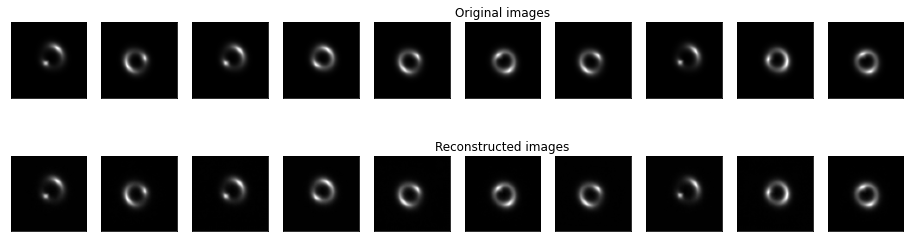

Epoch 297/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.0573730709880675e-05, Val Recon loss: 1.52296345024499e-05, 
 Disc loss: 0.05191728472709656, Gen loss: 8.972823143005371

Epoch 298/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 1.1184149192660833e-05, Val Recon loss: 6.68966145490736e-06, 
 Disc loss: 0.0607592798769474, Gen loss: 10.029483795166016

Epoch 299/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.91644132839517e-06, Val Recon loss: 9.855723065912673e-06, 
 Disc loss: 0.06212332472205162, Gen loss: 11.297857284545898

Epoch 300/300:


  0%|          | 0/107 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train Recon loss: 9.857540573019298e-06, Val Recon loss: 6.0169799730323976e-06, 
 Disc loss: 0.05475795269012451, Gen loss: 9.742499351501465



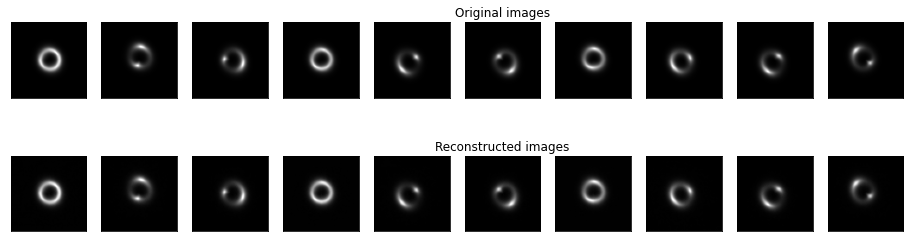

In [27]:
#Training and tracking model
model, loss_dict = fit_model(model, config, checkpoint_path = PATH)

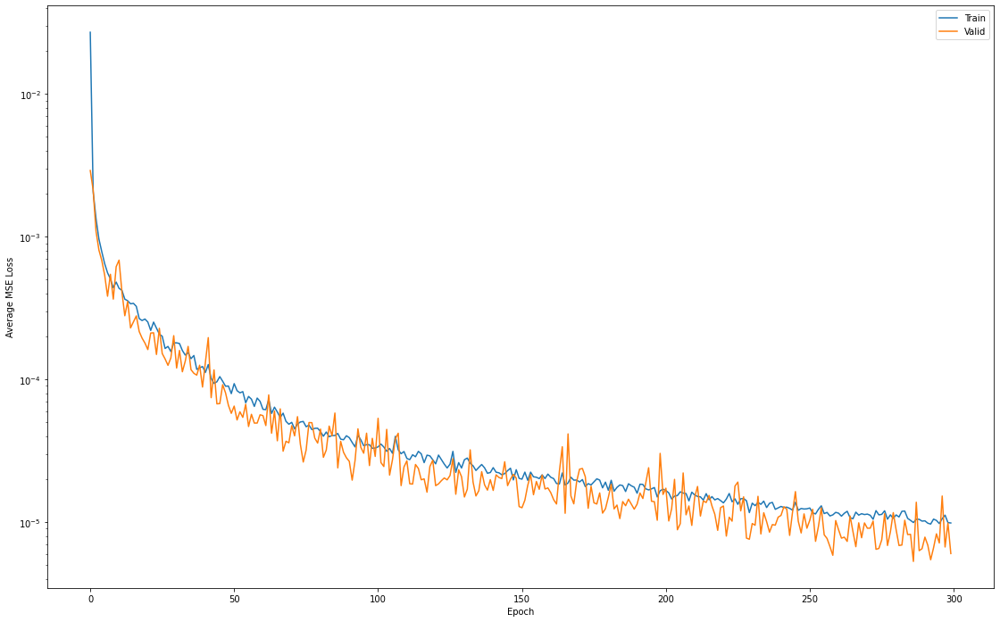

In [28]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['train_rec_loss'], label='Train')
plt.semilogy(loss_dict['val_rec_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average MSE Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "Recon_Loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Train, Val MSE recon loss history")]})

plt.show()

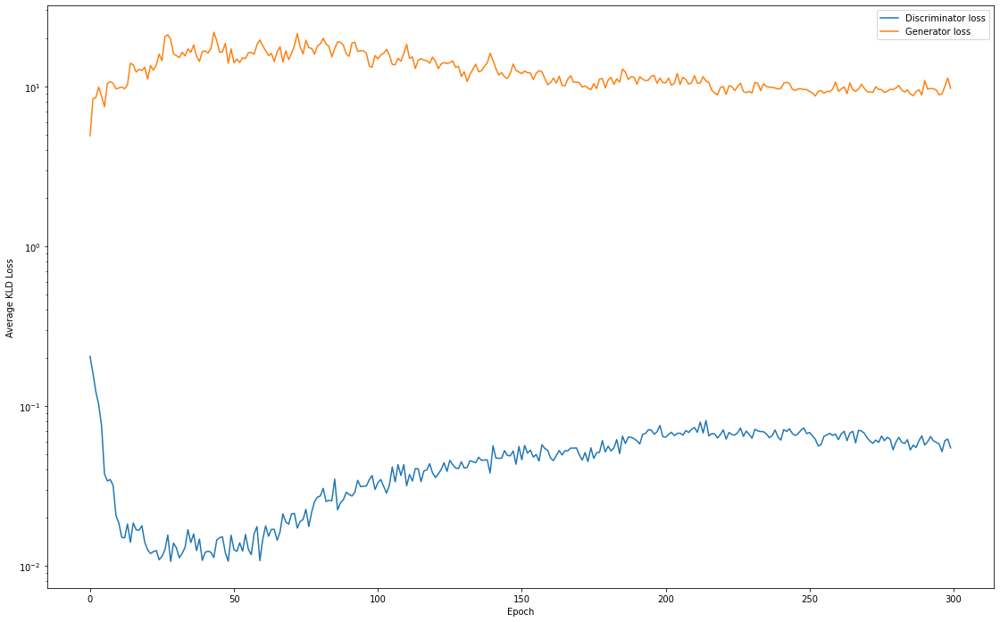

In [29]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['disc_loss'], label='Discriminator loss')
plt.semilogy(loss_dict['gen_loss'], label='Generator loss')
plt.xlabel('Epoch')
plt.ylabel('Average KLD Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "disc_vs_gen_loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Disc vs Gen loss history")]})

plt.show()

In [30]:
del encoder, decoder, disc
gc.collect()

encoder = Encoder().to(device)
decoder = Decoder().to(device)
disc = Discriminator().to(device)

encoder.load_state_dict(torch.load(PATH + 'encoder.pth'))
decoder.load_state_dict(torch.load(PATH + 'decoder.pth'))
disc.load_state_dict(torch.load(PATH + 'discriminator.pth'))

model = {'enc':encoder,
        'dec': decoder,
        'disc': disc}

In [31]:
criterion = nn.MSELoss()

_, _, train_mse = test_epoch(model, train_loader, criterion)
print("Train set MSE:" + str(train_mse))

_, _, val_mse = test_epoch(model, val_loader, criterion)
print("Val set MSE:" + str(val_mse))

_, _, test_mse = test_epoch(model, test_loader, criterion)
print("Test set MSE:" + str(test_mse))

  0%|          | 0/107 [00:00<?, ?it/s]

Train set MSE:7.375325146321617e-06


  0%|          | 0/9 [00:00<?, ?it/s]

Val set MSE:5.298385025930151e-06


  0%|          | 0/20 [00:00<?, ?it/s]

Test set MSE:5.297891584632453e-06


In [32]:
MSE_scores = [[train_mse, val_mse, test_mse]]

wandb.log({"MSE_Scores": wandb.Table(data = MSE_scores, columns=["Train_MSE", "Val_MSE", "Test_MSE"])})

## Model Testing for Anomaly Detection

In [33]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)
    class_map = {}
    class_distribution = {}
    
    for img_path in root_list:
        class_name = img_path.split(os.sep)[-2]
        if class_name not in class_distribution:
            class_distribution[class_name] = 1
        else:
            class_distribution[class_name] +=1
                
    for index, entity in enumerate(class_distribution):
        class_map[entity] = index
    print("Dataset Distribution:\n")
    print(class_distribution)
    print("\n\nClass indices:\n")
    print(class_map)

    data = []
    for img_path in tqdm(root_list):
        class_name = img_path.split(os.sep)[-2]
        data.append([img_path, class_name])
        
    return data, class_map

In [34]:
class CustomDataset(Dataset):
    def __init__(self, img_paths_and_labels_list, class_map,transform = None):
        self.data = img_paths_and_labels_list
        self.class_map = class_map
        self.transform = transform
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_path, class_name = self.data[idx]
        img = np.load(img_path, allow_pickle = True)
        if class_name == 'axion':
            img = img[0]
        img = (img - np.min(img))/(np.max(img) - np.min(img))
        
        if self.transform:
            aug = self.transform(image=img)
            img = aug['image']
        
        img = img.to(torch.float)
        class_id = self.class_map[class_name]
        class_id = torch.tensor(class_id)

        return img, class_id

In [35]:
full_test_data_root_dir = r'../input/gsocml4scimodel2test/Model_II_test/*/*'
full_test_dataset_img_paths_list, class_map = img_paths_list(full_test_data_root_dir)

Dataset Distribution:

{'axion': 5000, 'no_sub': 5000, 'cdm': 5000}


Class indices:

{'axion': 0, 'no_sub': 1, 'cdm': 2}


  0%|          | 0/15000 [00:00<?, ?it/s]

In [36]:
full_test_dataset = CustomDataset(full_test_dataset_img_paths_list, class_map, transform = test_transforms)
print(len(full_test_dataset))

15000


In [37]:
full_test_loader = DataLoader(full_test_dataset, batch_size = config["batch_size"], shuffle = False, num_workers = 2)
single_batch = next(iter(test_loader))
single_batch[0].shape

torch.Size([1, 64, 64])

In [38]:
def final_test_epoch(model, dataloader,criterion):

    encoder, decoder, disc = model["enc"], model["dec"], model["disc"]
   
    encoder.eval()
    decoder.eval()
    disc.eval()
    
    losses = []
    
    truth_list = []

    with torch.no_grad():

        loop=tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, (img_batch, class_ids) in loop:
            
            for img, class_id in zip(img_batch,class_ids):
                
                if class_id == class_map['no_sub']:
                    truth_list.append(0)
                else:
                    truth_list.append(1)
                    
                img = img.unsqueeze(0)
                X = img.to(device)
                
                encoded_space = encoder(X)
                recon = decoder(encoded_space)
                
                loss = criterion(recon, X).item()
                losses.append(loss)
                   

    return np.asarray(losses), np.asarray(truth_list), np.mean(losses)

In [39]:
criterion = nn.MSELoss()
loss_list, truth_list, mean_loss = final_test_epoch(model, full_test_loader,criterion)
print(mean_loss)

  0%|          | 0/59 [00:00<?, ?it/s]

5.7368343449600916e-05


In [40]:
fpr, tpr, thresholds = roc_curve(truth_list, loss_list)
roc_auc = auc(fpr, tpr)

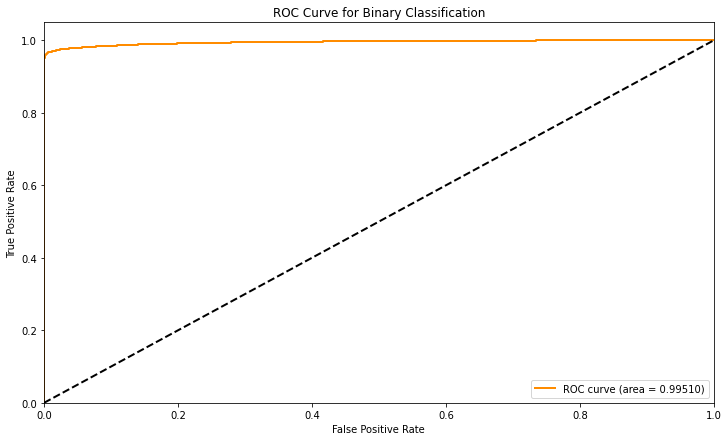

In [41]:
# Plot the AUC
plt.figure(figsize = (12, 7))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.5f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Binary Classification')
plt.legend(loc="lower right", prop={"size":10})

plot_name = "ROC-AUC"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"ROC-AUC curve")]})

plt.show()

In [42]:
wandb.finish()

disc_loss,█▃▂▁▁▁▁▁▁▂▂▂▂▂▃▃▄▃▃▄▅▄▄▄▅▅▅▆▅▅▅▅▆▅▅▆▅▅▅▄
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
gen_loss,▂▂▄▄▅▆▇▆▆▇█▇▇▅▅▅▄▂▆▄▃▂▃▂▂▃▂▂▂▂▁▂▂▁▂▁▁▁▁▁
train_rec_loss,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_rec_loss,█▆▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
disc_loss,0.05476
epoch,300
gen_loss,9.7425
train_rec_loss,1e-05
val_rec_loss,1e-05
